# Case 3: fixed-epoch asymptotic normality

DPLQR only; tau = 0.5, theta = (1, -1). Compare centering and coverage at
200, 500 and 1000 epochs using paired data/initialization across epoch settings.
Every main and SE projection fit runs its specified epoch count, with no stopping
or best-weight restoration. Validation is monitored only, preserving the pilot's RNG path.
The saved September 10 pilot had a 100-epoch ceiling and patience 15.

Run cells in order with the repository's Python kernel. Increase Q and rerun to
extend completed results. This notebook is supplied unexecuted.


In [1]:
from pathlib import Path
from types import FunctionType, SimpleNamespace
from contextlib import contextmanager
import ast
import hashlib
import importlib.metadata
import importlib.util
import itertools
import json
import math
import os
import platform
import random
import subprocess
import sys

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import norm, skew, kurtosis, probplot
from sklearn.preprocessing import StandardScaler
import torch
from torch import nn
from torchtuples import Model
import torchtuples as tt
from IPython.display import display

ROOT = next(p for p in (Path.cwd(), *Path.cwd().parents) if (p / "dqAux.py").is_file())
NOTEBOOK_NAME = "asymptotic_normality_case3.ipynb"
search_dirs = [p for p in (Path.cwd(), *Path.cwd().parents) if p == ROOT or ROOT in p.parents]
NOTEBOOK = next((p / NOTEBOOK_NAME for p in search_dirs if (p / NOTEBOOK_NAME).is_file()), None)
if NOTEBOOK is None:
    candidates = sorted((ROOT / "results").glob(f"*/{NOTEBOOK_NAME}"))
    if len(candidates) != 1:
        raise FileNotFoundError(
            f"Cannot uniquely locate {NOTEBOOK_NAME}. Start the kernel in its experiment folder. "
            f"Candidates: {[str(p) for p in candidates]}"
        )
    NOTEBOOK = candidates[0]
NOTEBOOK = NOTEBOOK.resolve()
EXPERIMENT = NOTEBOOK.parent
OUTPUT_DIR = EXPERIMENT / "run"

Q = 200
SAMPLE_SIZES = (500, 1000, 2000, 4000)
EPOCH_COUNTS = (200, 500, 1000)
CASE, TAU = 3, 0.5
THETA_0 = np.array([1.0, -1.0])
BASE_SEED = 20260904
TRAIN_FRACTION = 0.8
HP = dict(depth=2, width=32, batch_size=128, lr=0.005)
THREADS = 1

assert isinstance(Q, int) and Q >= 1
assert CASE == 3 and TAU == 0.5 and np.array_equal(THETA_0, [1.0, -1.0])
assert SAMPLE_SIZES == (500, 1000, 2000, 4000)
assert EPOCH_COUNTS == (200, 500, 1000)
assert TRAIN_FRACTION == 0.8
torch.set_num_threads(THREADS)
torch.use_deterministic_algorithms(True)


Reuse the September 10 source bridge and the September 4 DGP/SE definitions.
The only R call is the existing base-R residual density estimator used for SEs
(set RSCRIPT if Rscript is not detected). Networks and losses come from root dqAux.py.
Z is standardized on training observations; X and Y retain their original scales.
Post-fit nuisance clipping and the full 2×2 covariance estimator follow the pilot.


In [2]:
BRIDGE_PATH = ROOT / "results/2026-09-10-asymptotic-normality/source_bridge.py"
spec = importlib.util.spec_from_file_location("case3_source_bridge", BRIDGE_PATH)
bridge = importlib.util.module_from_spec(spec)
bytecode_setting = sys.dont_write_bytecode
try:
    sys.dont_write_bytecode = True
    spec.loader.exec_module(bridge)
finally:
    sys.dont_write_bytecode = bytecode_setting

dqNetSparse, covNet = bridge.dqNetSparse, bridge.covNet
checkLoss, checkErrorMean = bridge.checkLoss, bridge.checkErrorMean
REUSED = (
    "seed_all", "nonlinear_truth", "generate_covariates", "generate_dataset",
    "as_numpy", "clip_neural_weights", "tensor_pair", "dplqr_standard_errors",
)
nodes = bridge.selected_source()
science = dict(np=np, norm=norm, random=random, torch=torch, THETA=THETA_0,
               residual_density_zero=bridge.residual_density_zero)
module = ast.Module(body=[nodes[name] for name in REUSED], type_ignores=[])
exec(compile(module, str(bridge.NOTEBOOK), "exec"), science)
original = SimpleNamespace(**{name: science[name] for name in REUSED})


def make_case3(n, rep):
    data_seed = BASE_SEED + CASE * 10_000_000 + n * 1000 + rep
    fit_seed = data_seed + int(round(TAU * 1_000_000))
    rng = np.random.default_rng(data_seed)
    x, z, y, _ = original.generate_dataset(n, 3, rng)
    order = rng.permutation(n)
    tr, va = order[:int(TRAIN_FRACTION * n)], order[int(TRAIN_FRACTION * n):]
    scaler = StandardScaler().fit(z[tr])
    digest = hashlib.sha256(b"".join(a.tobytes() for a in (x, z, y, order))).hexdigest()
    return SimpleNamespace(
        n=n, rep=rep, data_seed=data_seed, fit_seed=fit_seed, data_sha256=digest,
        x_train=x[tr], z_train=z[tr], y_train=y[tr],
        x_val=x[va], z_val=z[va], y_val=y[va], scaler=scaler,
    )


Each epoch setting starts from the same seeds and gets a fresh optimizer.
Both auxiliary projections use that setting's epoch count, as the original
SE routine shares the main fit's profile. Epoch comparisons therefore include
changes in both coefficient and projection optimization.


In [3]:
class EpochCounter(tt.callbacks.Callback):
    """Count complete epochs and batches; never select or restore weights."""
    def __init__(self, epochs, n_train):
        self.requested = epochs
        self.expected_updates = epochs * math.ceil(n_train / HP["batch_size"])

    def on_fit_start(self):
        self.epochs_run = self.updates = 0
        return False

    def on_batch_end(self):
        if not torch.isfinite(self.model.batch_loss).item():
            raise FloatingPointError("Non-finite training loss")
        self.updates += 1
        return False

    def on_epoch_end(self):
        self.epochs_run += 1
        return False

    def on_fit_end(self):
        if self.epochs_run != self.requested or self.updates != self.expected_updates:
            raise RuntimeError("Fit did not complete its exact epoch/update budget")
        return False


def fit_fixed(net, loss, train_x, train_y, val_x, val_y, epochs):
    model = Model(net, loss, device="cpu")
    model.optimizer.set_lr(HP["lr"])
    counter = EpochCounter(epochs, len(train_y))
    log = model.fit(
        train_x, torch.tensor(train_y[:, None], dtype=torch.float32),
        batch_size=HP["batch_size"], epochs=epochs, callbacks=[counter],
        verbose=False, shuffle=True, num_workers=0,
        val_data=(val_x, torch.tensor(val_y[:, None], dtype=torch.float32)),
        val_batch_size=HP["batch_size"],
    ).to_pandas()
    if len(log) != epochs:
        raise RuntimeError("Training log has an unexpected epoch count")
    details = dict(epochs_run=counter.epochs_run, updates=counter.updates,
                   last_epoch_train_loss=float(log["train_loss"].iloc[-1]),
                   last_epoch_validation_loss=float(log["val_loss"].iloc[-1]))
    if not np.isfinite(list(details.values())).all():
        raise FloatingPointError("Non-finite fit diagnostics")
    return model, details


Atomic checkpoints retain each completed network and result under its
(n, epochs, replication) key. An unfinished network restarts from its seed.
A run fingerprint prevents mixing incompatible settings; Q can increase.
If a kernel is killed, remove its run/.run.lock only after it has exited.


In [4]:
def atomic_write(path, value, kind="json"):
    temporary = path.with_suffix(path.suffix + ".tmp")
    if kind == "torch":
        torch.save(value, temporary)
    elif kind == "csv":
        value.to_csv(temporary, index=False)
    else:
        temporary.write_text(json.dumps(value, indent=2, allow_nan=False) + "\n", encoding="utf-8")
    temporary.replace(path)


@contextmanager
def run_lock(output):
    path = output / ".run.lock"
    try:
        descriptor = os.open(path, os.O_CREAT | os.O_EXCL | os.O_WRONLY)
    except FileExistsError as exc:
        raise RuntimeError(f"Run lock exists: {path}; check its process before removing it") from exc
    try:
        with os.fdopen(descriptor, "w") as stream:
            json.dump(dict(pid=os.getpid(), host=platform.node()), stream)
        yield
    finally:
        path.unlink(missing_ok=True)


def run_identity():
    notebook = json.loads(NOTEBOOK.read_text(encoding="utf-8"))
    implementation = "".join(
        "".join(cell["source"]) for cell in notebook["cells"]
        if "experiment_code" in cell.get("metadata", {}).get("tags", [])
    )
    sources = (ROOT / "dqAux.py", BRIDGE_PATH, bridge.NOTEBOOK,
               BRIDGE_PATH.parent / "density_only.R")
    r_version = subprocess.run([bridge.find_rscript(), "--version"], capture_output=True,
                               text=True, check=True, timeout=30)
    return dict(
        schema=1, case=CASE, tau=TAU, theta=THETA_0.tolist(), seed=BASE_SEED,
        train_fraction=TRAIN_FRACTION, hp=HP, threads=THREADS,
        deterministic_algorithms=True, early_stopping=False,
        projection_epochs="same as main", validation="monitor only", clipping="post-fit nuisance",
        implementation_sha256=hashlib.sha256(implementation.encode()).hexdigest(),
        sources={str(p.relative_to(ROOT)): hashlib.sha256(p.read_bytes()).hexdigest() for p in sources},
        versions={name: importlib.metadata.version(name) for name in
                  ("numpy", "pandas", "scipy", "scikit-learn", "torch", "torchtuples")},
        python=platform.python_version(), platform=platform.platform(),
        r_version=(r_version.stdout + r_version.stderr).strip(),
    )


def replication_directory(output, n, epochs, rep):
    return output / "replications" / f"n_{n}_epochs_{epochs}_rep_{rep:06d}"


def fit_replication(data, epochs, directory, fingerprint):
    directory.mkdir(parents=True, exist_ok=True)
    setting = dict(n=data.n, epochs=epochs, rep=data.rep)
    stage_path = directory / "fits.pt"
    if stage_path.exists():
        bundle = torch.load(stage_path, map_location="cpu", weights_only=True)
        if (bundle["fingerprint"] != fingerprint or bundle["setting"] != setting
                or bundle["data_sha256"] != data.data_sha256):
            raise ValueError(f"Incompatible checkpoint: {stage_path}")
    else:
        bundle = dict(fingerprint=fingerprint, setting=setting,
                      data_sha256=data.data_sha256, stages={})

    def stage(name, seed, net_factory, loss, train_x, train_y, val_x, val_y, clip=False):
        original.seed_all(seed)
        net = net_factory()
        saved = bundle["stages"].get(name)
        if saved is None:
            model, details = fit_fixed(net, loss, train_x, train_y, val_x, val_y, epochs)
            if clip:
                original.clip_neural_weights(model.net)
            saved = dict(state=model.net.state_dict(), seed=seed, **details)
            bundle["stages"][name] = saved
            atomic_write(stage_path, bundle, "torch")
        else:
            if (saved["seed"] != seed or saved["epochs_run"] != epochs
                    or saved["updates"] != epochs * math.ceil(len(train_y) / HP["batch_size"])):
                raise ValueError(f"Incomplete or incompatible stage: {stage_path} / {name}")
            net.load_state_dict(saved["state"])
            model = Model(net, loss, device="cpu")
        return model, saved

    def main_net():
        net = dqNetSparse(2, 8, torch.zeros((1, 2), dtype=torch.float32),
                          [HP["depth"], HP["width"]], sparseRatio=0.5)
        net.linLinear.reset_parameters()
        return net

    train_x = original.tensor_pair(data.x_train, data.scaler.transform(data.z_train))
    val_x = original.tensor_pair(data.x_val, data.scaler.transform(data.z_val))
    model, main = stage("main", data.fit_seed, main_net, checkLoss(tau=TAU),
                        train_x, data.y_train, val_x, data.y_val, clip=True)

    def cached_projection(z_train, target_train, z_val, target_val, hp, seed, binary):
        column = 1 if binary else 2
        projection, saved = stage(
            f"projection_{column}", seed,
            lambda: covNet(8, [hp["depth"], hp["width"]], logic=binary),
            nn.MSELoss(), torch.tensor(z_train, dtype=torch.float32), target_train,
            torch.tensor(z_val, dtype=torch.float32), target_val,
        )
        return projection, SimpleNamespace(epochs_run=saved["epochs_run"])

    # Reuse the full SE formula with only the projection fitter replaced.
    se_function = FunctionType(
        original.dplqr_standard_errors.__code__,
        dict(science, fit_projection=cached_projection), "fixed_epoch_standard_errors",
    )
    se, density, projection_epochs = se_function(
        model, data.scaler, dict(HP, epochs=epochs),
        data.x_train, data.z_train, data.y_train,
        data.x_val, data.z_val, data.y_val, TAU, data.fit_seed + 500_000,
    )
    theta = model.net.linLinear.weight.detach().cpu().numpy().reshape(-1).astype(float)
    if not np.isfinite(theta).all() or not np.isfinite(se).all() or np.any(se <= 0):
        raise FloatingPointError("Invalid coefficient or SE")
    if projection_epochs != [epochs, epochs]:
        raise RuntimeError("Projection epoch count mismatch")
    n_train = len(data.y_train)
    errors = theta - THETA_0
    lower, upper = theta - norm.ppf(0.975) * se, theta + norm.ppf(0.975) * se
    prediction = original.as_numpy(model.predict(train_x)).reshape(-1, 1)
    row = dict(
        case=3, method="DPLQR", tau=TAU, **setting, n_train=n_train, n_val=len(data.y_val),
        data_seed=data.data_seed, fit_seed=data.fit_seed, data_sha256=data.data_sha256,
        epochs_run=main["epochs_run"], optimizer_updates=main["updates"],
        projection_1_epochs_run=projection_epochs[0], projection_2_epochs_run=projection_epochs[1],
        projection_1_seed=data.fit_seed + 500_000, projection_2_seed=data.fit_seed + 500_001,
        density_zero=float(density), last_epoch_train_loss=main["last_epoch_train_loss"],
        last_epoch_validation_loss=main["last_epoch_validation_loss"],
        training_loss=float(checkErrorMean(prediction, data.y_train[:, None], tau=TAU)),
    )
    for j in (1, 2):
        i = j - 1
        row.update({
            f"theta_hat_{j}": float(theta[i]), f"theta_0_{j}": float(THETA_0[i]),
            f"estimated_se_{j}": float(se[i]), f"theta_error_{j}": float(errors[i]),
            f"root_n_train_error_{j}": float(np.sqrt(n_train) * errors[i]),
            f"T_{j}": float(errors[i] / se[i]), f"ci_lower_{j}": float(lower[i]),
            f"ci_upper_{j}": float(upper[i]),
            f"covered_{j}": bool(lower[i] <= THETA_0[i] <= upper[i]),
        })
    if not all(np.isfinite(v) for v in row.values() if isinstance(v, (int, float))):
        raise FloatingPointError("Non-finite replication result")
    atomic_write(directory / "result.json", dict(fingerprint=fingerprint, row=row))
    return row


def collect_results(output, fingerprint, expected):
    rows = []
    for path in sorted((output / "replications").glob("n_*_epochs_*_rep_*/result.json")):
        saved = json.loads(path.read_text(encoding="utf-8"))
        row = saved["row"]
        key = (row["n"], row["epochs"], row["rep"])
        if saved["fingerprint"] != fingerprint or key not in expected:
            raise ValueError(f"Incompatible result or reduced grid/Q: {path}")
        if path.parent != replication_directory(output, *key):
            raise ValueError(f"Result key/path mismatch: {path}")
        rows.append(row)
    if len({(r["n"], r["epochs"], r["rep"]) for r in rows}) != len(rows):
        raise ValueError("Duplicate replication keys")
    return rows


In [14]:
def run_experiment():
    output = OUTPUT_DIR.resolve()
    if EXPERIMENT.resolve() not in output.parents:
        raise ValueError("OUTPUT_DIR must be a subdirectory of this experiment")
    output.mkdir(parents=True, exist_ok=True)
    identity = run_identity()
    fingerprint = hashlib.sha256(json.dumps(identity, sort_keys=True).encode()).hexdigest()
    expected = set(itertools.product(SAMPLE_SIZES, EPOCH_COUNTS, range(1, Q + 1)))
    config_path = output / "run_config.json"

    with run_lock(output):
        if config_path.exists():
            old = json.loads(config_path.read_text(encoding="utf-8"))
            if old["identity"] != identity:
                raise ValueError("Configuration/source changed; choose a fresh OUTPUT_DIR")
            if Q < old["requested_Q"]:
                raise ValueError("Retain or increase Q when resuming this output directory")
        elif (output / "replications").exists():
            raise ValueError("Checkpoints exist without a run identity")
        rows = collect_results(output, fingerprint, expected)
        completed = {(r["n"], r["epochs"], r["rep"]) for r in rows}
        metadata = dict(identity=identity, fingerprint=fingerprint, requested_Q=Q,
                        sample_sizes=list(SAMPLE_SIZES), epoch_counts=list(EPOCH_COUNTS),
                        expected_rows=len(expected))

        def checkpoint(status, error=None):
            if rows:
                atomic_write(output / "raw_replications.csv",
                             pd.DataFrame(rows).sort_values(["n", "epochs", "rep"]), "csv")
            metadata.update(status=status, completed_rows=len(rows), error=error)
            atomic_write(config_path, metadata)

        checkpoint("running")
        try:
            for n in SAMPLE_SIZES:
                for rep in range(1, Q + 1):
                    missing = [e for e in EPOCH_COUNTS if (n, e, rep) not in completed]
                    if not missing:
                        continue
                    data = make_case3(n, rep)
                    for epochs in missing:
                        row = fit_replication(data, epochs,
                                              replication_directory(output, n, epochs, rep), fingerprint)
                        rows.append(row)
                        completed.add((n, epochs, rep))
                        checkpoint("running")
                        print(f"Saved n={n}, epochs={epochs}, rep={rep}; {len(rows)}/{len(expected)}")
            if completed != expected:
                raise RuntimeError("Incomplete experiment grid")
            checkpoint("complete")
        except BaseException as exc:
            checkpoint("failed", repr(exc))
            raise
    return pd.DataFrame(rows).sort_values(["n", "epochs", "rep"]).reset_index(drop=True)


The next cell runs the simulation when explicitly executed. To regenerate
reports later without fitting, skip it and run the summary and plotting cells.


In [15]:
raw = run_experiment()


c:\Users\Tiansui Tu\Documents\GitHub\dplqr\.venv\Lib\site-packages\torchtuples\callbacks.py:607: UserWarning: This overload of add is deprecated:
	add(Number alpha, Tensor other)
Consider using one of the following signatures instead:
	add(Tensor other, *, Number alpha = 1) (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\torch\csrc\utils\python_arg_parser.cpp:1841.)
  p.data = p.data.add(-weight_decay * eta, p.data)


Saved n=1000, epochs=500, rep=26; 797/2400
Saved n=1000, epochs=1000, rep=26; 798/2400
Saved n=1000, epochs=200, rep=27; 799/2400
Saved n=1000, epochs=500, rep=27; 800/2400
Saved n=1000, epochs=1000, rep=27; 801/2400
Saved n=1000, epochs=200, rep=28; 802/2400
Saved n=1000, epochs=500, rep=28; 803/2400
Saved n=1000, epochs=1000, rep=28; 804/2400
Saved n=1000, epochs=200, rep=29; 805/2400
Saved n=1000, epochs=500, rep=29; 806/2400
Saved n=1000, epochs=1000, rep=29; 807/2400
Saved n=1000, epochs=200, rep=30; 808/2400
Saved n=1000, epochs=500, rep=30; 809/2400
Saved n=1000, epochs=1000, rep=30; 810/2400
Saved n=1000, epochs=200, rep=31; 811/2400
Saved n=1000, epochs=500, rep=31; 812/2400
Saved n=1000, epochs=1000, rep=31; 813/2400
Saved n=1000, epochs=200, rep=32; 814/2400
Saved n=1000, epochs=500, rep=32; 815/2400
Saved n=1000, epochs=1000, rep=32; 816/2400
Saved n=1000, epochs=200, rep=33; 817/2400
Saved n=1000, epochs=500, rep=33; 818/2400
Saved n=1000, epochs=1000, rep=33; 819/2400
Sav

In [6]:
# Read only completed results; summaries include their actual replication counts.
output = OUTPUT_DIR.resolve()
if EXPERIMENT.resolve() not in output.parents:
    raise ValueError("OUTPUT_DIR must be a subdirectory of this experiment")
metadata = json.loads((output / "run_config.json").read_text(encoding="utf-8"))
expected = set(itertools.product(SAMPLE_SIZES, EPOCH_COUNTS, range(1, Q + 1)))
raw = pd.DataFrame(collect_results(output, metadata["fingerprint"], expected))
if raw.empty:
    raise ValueError("No completed replications to summarize")
raw = raw.sort_values(["n", "epochs", "rep"]).reset_index(drop=True)
records = []
for n, epochs in itertools.product(SAMPLE_SIZES, EPOCH_COUNTS):
    group = raw.loc[(raw["n"] == n) & (raw["epochs"] == epochs)]
    if group.empty:
        continue
    if group["n_train"].nunique() != 1:
        raise ValueError("Mixed training sample sizes in a setting")
    n_train = int(group["n_train"].iloc[0])
    for j in (1, 2):
        errors = group[f"theta_error_{j}"].to_numpy()
        t_values = group[f"T_{j}"].to_numpy()
        q025, q50, q975 = np.quantile(t_values, [0.025, 0.5, 0.975], method="linear")
        empirical_sd = float(group[f"theta_hat_{j}"].std(ddof=1))
        records.append(dict(
            n=n, epochs=epochs, coefficient=j, n_train=n_train, Q_completed=len(group),
            Q_requested=Q, complete=len(group) == Q,
            bias=float(errors.mean()), root_n_train_scaled_bias=float(np.sqrt(n_train) * errors.mean()),
            empirical_sd=empirical_sd, root_n_train_scaled_sd=float(np.sqrt(n_train) * empirical_sd),
            mean_estimated_se=float(group[f"estimated_se_{j}"].mean()),
            mean_T=float(t_values.mean()), sd_T=float(pd.Series(t_values).std(ddof=1)),
            skewness_T=float(skew(t_values, bias=False)) if len(group) >= 3 and np.ptp(t_values) > 0 else np.nan,
            excess_kurtosis_T=float(kurtosis(t_values, fisher=True, bias=False))
                              if len(group) >= 4 and np.ptp(t_values) > 0 else np.nan,
            T_q025=float(q025), T_q50=float(q50), T_q975=float(q975),
            coverage_95=float(group[f"covered_{j}"].mean()),
            mean_training_loss=float(group["training_loss"].mean()),
        ))
summary = pd.DataFrame(records)
atomic_write(output / "raw_replications.csv", raw, "csv")
atomic_write(output / "summary.csv", summary, "csv")
display(summary.loc[summary["coefficient"] == 1].round(4))


,n,epochs,coefficient,n_train,Q_completed,Q_requested,complete,bias,root_n_train_scaled_bias,empirical_sd,...,mean_estimated_se,mean_T,sd_T,skewness_T,excess_kurtosis_T,T_q025,T_q50,T_q975,coverage_95,mean_training_loss
0,500,200,1,400,200,200,True,-0.2329,-4.6581,0.1811,...,0.2102,-1.1970,0.9497,-0.4441,0.3451,-3.1762,-1.2122,0.5357,0.800,0.3507
2,500,500,1,400,200,200,True,-0.1721,-3.4428,0.2020,...,0.2683,-0.8207,1.1415,-1.1048,2.9052,-3.6457,-0.6774,1.0281,0.875,0.2716
4,500,1000,1,400,200,200,True,-0.1513,-3.0264,0.2376,...,0.6618,-0.5144,0.9839,-0.7890,3.3898,-3.0596,-0.4968,1.3706,0.950,0.2946
6,1000,200,1,800,200,200,True,-0.0925,-2.6164,0.1306,...,0.1482,-0.6606,0.9686,-0.0785,-0.1010,-2.5850,-0.6435,1.3185,0.915,0.3877
8,1000,500,1,800,200,200,True,-0.0662,-1.8716,0.1488,...,0.2305,-0.3311,0.7288,-0.6542,1.7937,-1.5369,-0.2502,0.9712,0.990,0.4057
10,1000,1000,1,800,200,200,True,-0.0493,-1.3937,0.1728,...,0.3219,-0.1675,0.6206,-0.3945,1.6231,-1.5311,-0.1658,0.9427,0.985,0.4793
12,2000,200,1,1600,200,200,True,-0.0164,-0.6566,0.1020,...,0.1202,-0.1444,0.8677,0.2565,0.2939,-1.7323,-0.1587,1.8254,0.970,0.4505
14,2000,500,1,1600,200,200,True,-0.0128,-0.5117,0.1127,...,0.1799,-0.0716,0.6410,0.2964,0.5644,-1.2159,-0.0473,1.3590,0.995,0.4948
16,2000,1000,1,1600,200,200,True,-0.0125,-0.5006,0.1214,...,0.2374,-0.0529,0.5197,0.4467,0.5401,-0.9635,-0.0573,1.0614,1.000,0.5707
18,4000,200,1,3200,200,200,True,-0.0128,-0.7243,0.0642,...,0.0834,-0.1555,0.7794,0.1299,0.2321,-1.6270,-0.1719,1.4820,0.985,0.4944


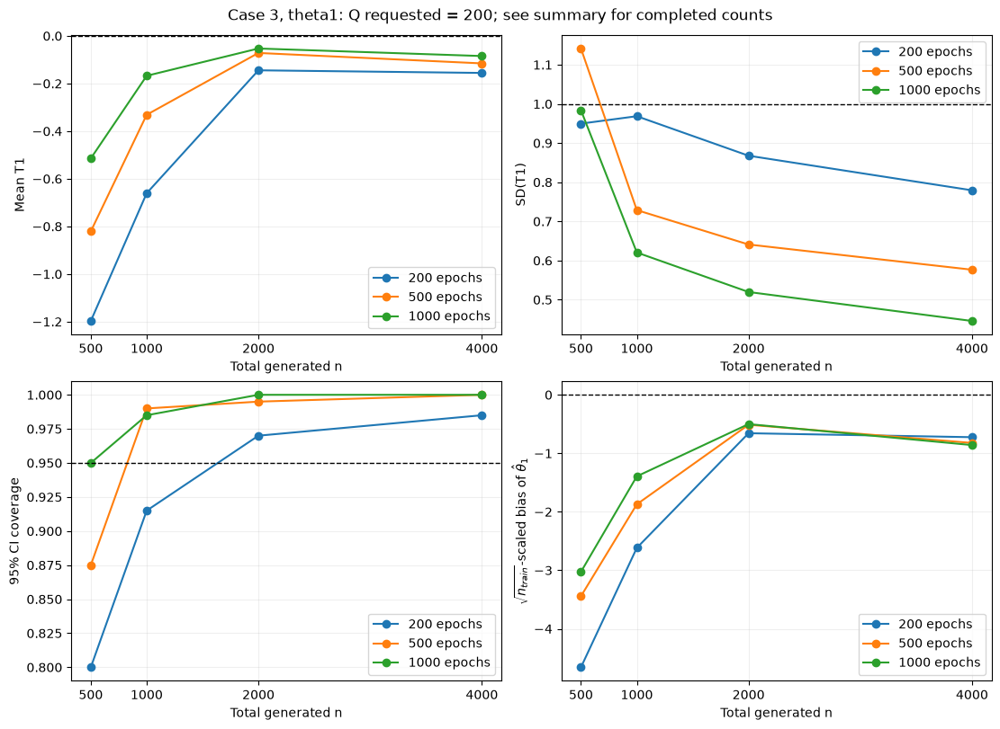

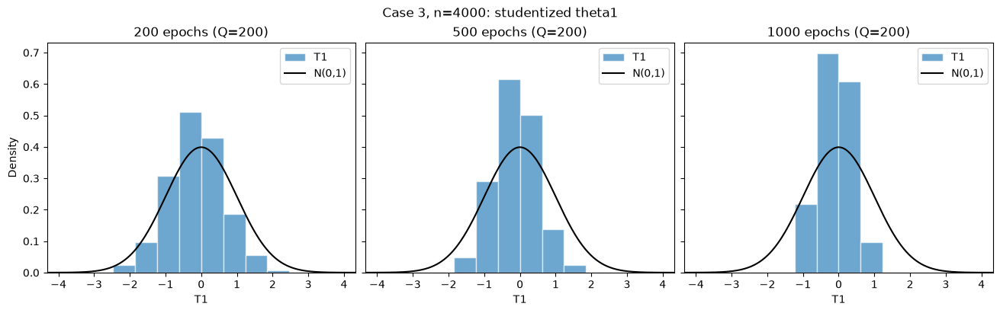

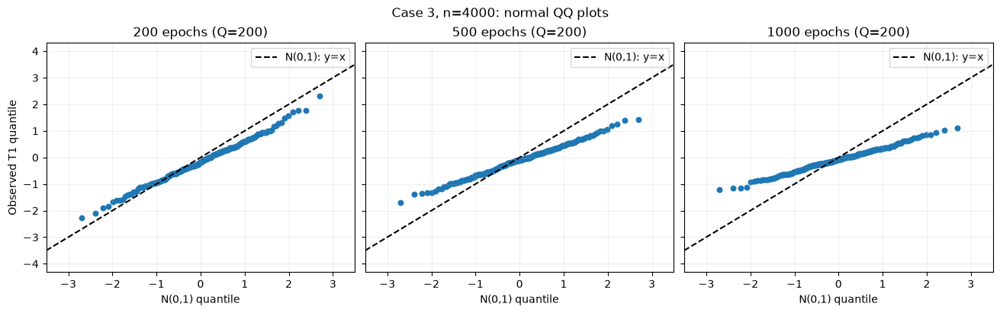

In [7]:
figures = output / "figures"
figures.mkdir(parents=True, exist_ok=True)
primary = summary.loc[summary["coefficient"] == 1]
fig, axes = plt.subplots(2, 2, figsize=(11, 8), constrained_layout=True)
panels = [
    ("mean_T", "Mean T1", 0),
    ("sd_T", "SD(T1)", 1),
    ("coverage_95", "95% CI coverage", 0.95),
    ("root_n_train_scaled_bias", r"$\sqrt{n_{train}}$-scaled bias of $\hat\theta_1$", 0),
]
for ax, (metric, label, reference) in zip(axes.flat, panels):
    for epochs in EPOCH_COUNTS:
        group = primary.loc[primary["epochs"] == epochs].sort_values("n")
        ax.plot(group["n"], group[metric], marker="o", label=f"{epochs} epochs")
    ax.axhline(reference, color="black", ls="--", lw=1)
    ax.set(xlabel="Total generated n", ylabel=label, xticks=SAMPLE_SIZES)
    ax.grid(alpha=0.2)
    ax.legend()
fig.suptitle(f"Case 3, theta1: Q requested = {Q}; see summary for completed counts")
fig.savefig(figures / "theta1_by_sample_size.png", dpi=180, bbox_inches="tight")
plt.show()

largest_n = 4000
values = {
    e: raw.loc[(raw["n"] == largest_n) & (raw["epochs"] == e), "T_1"].to_numpy()
    for e in EPOCH_COUNTS
}
available = [v for v in values.values() if len(v)]
if not available:
    raise ValueError("No completed n=4000 replications for distribution plots")
pooled = np.concatenate(available)
lo, hi = min(-4.0, float(pooled.min())), max(4.0, float(pooled.max()))
padding = 0.04 * (hi - lo)
lo, hi = lo - padding, hi + padding
bins = np.linspace(lo, hi, max(7, int(np.sqrt(max(map(len, available)))) + 1))
grid = np.linspace(lo, hi, 500)
fig, axes = plt.subplots(1, len(EPOCH_COUNTS), figsize=(13, 4), sharex=True, sharey=True,
                         constrained_layout=True)
for ax, epochs in zip(np.atleast_1d(axes), EPOCH_COUNTS):
    t_values = values[epochs]
    if len(t_values):
        ax.hist(t_values, bins=bins, density=True, alpha=0.65, edgecolor="white", label="T1")
    ax.plot(grid, norm.pdf(grid), color="black", label="N(0,1)")
    ax.set(title=f"{epochs} epochs (Q={len(t_values)})", xlabel="T1", xlim=(lo, hi))
    ax.legend()
axes[0].set_ylabel("Density")
fig.suptitle(f"Case 3, n={largest_n}: studentized theta1")
fig.savefig(figures / "theta1_histograms_n4000.png", dpi=180, bbox_inches="tight")
plt.show()

fig, axes = plt.subplots(1, len(EPOCH_COUNTS), figsize=(13, 4), sharex=True, sharey=True,
                         constrained_layout=True)
for ax, epochs in zip(np.atleast_1d(axes), EPOCH_COUNTS):
    t_values = values[epochs]
    if len(t_values) >= 2:
        theoretical, ordered = probplot(t_values, dist="norm", fit=False)
        ax.scatter(theoretical, ordered, s=22)
    ax.plot([lo, hi], [lo, hi], color="black", ls="--", label="N(0,1): y=x")
    ax.set(title=f"{epochs} epochs (Q={len(t_values)})", xlabel="N(0,1) quantile",
           xlim=(-3.5, 3.5), ylim=(lo, hi))
    ax.grid(alpha=0.2)
    ax.legend()
axes[0].set_ylabel("Observed T1 quantile")
fig.suptitle(f"Case 3, n={largest_n}: normal QQ plots")
fig.savefig(figures / "theta1_qq_n4000.png", dpi=180, bbox_inches="tight")
plt.show()


Assess whether mean T1 approaches 0, SD(T1) approaches 1, and coverage approaches
0.95 as epochs increase, alongside scaled bias and the n=4000 distributions.
Q=20 supports a pilot comparison; use larger Q for stable tail and coverage estimates.
Training loss is the final clipped model's full training check loss;
last_epoch_train_loss is the optimizer's last epoch minibatch loss.


# Oracle nuisance diagnostic: reuse the existing Q=200 fits

**Execution:** restart the kernel and run only this appended section, from this heading onward.
It has its own imports and reads the saved `run/raw_replications.csv`. Do not run the earlier
simulation or report-writing cells for this diagnostic. No main, projection, or density network
is fitted; R is not needed. All saved point estimates, existing cells, and existing outputs are retained.

The original 14 cells include historical setup/pilot wording. The saved run configuration is authoritative:
Q=200, n=500/1000/2000/4000, and epochs=200/500/1000. Actual counts are checked below.
New outputs go to `run/oracle_diagnostics/`; subsequent executions select a fresh `rerun_*`
subdirectory and use exclusive file creation. The pre-edit notebook is backed up as
`asymptotic_normality_case3_before_oracle.ipynb`.

## 0. Verified DGP, seeds, and inference implementation

The definitions were inspected in `../2026-09-04-homoscedastic-simulation/simulate_homoscedastic.ipynb`
(`generate_covariates`, `generate_dataset`, `nonlinear_truth`, `dplqr_standard_errors`), the
September 10 `source_bridge.py`, and this notebook's `make_case3`/`fit_replication` definitions.
The recorded source and experiment-code SHA-256 hashes are verified before reuse.

| Item | Implemented Case 3 |
|---|---|
| Latent copula | `default_rng(data_seed).multivariate_normal(zeros(10), covariance, size=n)`; covariance has diagonal 1 and every off-diagonal 0.5. |
| Raw nonlinear inputs | $Z_j=2\Phi(G_j)$ for $j=1,\ldots,8$. |
| Linear covariates | $X_1=1\{2\Phi(G_9)>1\}=1\{G_9>0\}$ and $X_2=2\Phi(G_{10})$. |
| Outcome | $Y=X^\top(1,-1)+m_3(Z)+\epsilon$; the original `nonlinear_truth` supplies $m_3$. |
| Errors | Independent, **unscaled** `rng.standard_t(df=3, size=n)`; no heteroskedastic multiplier or quantile shift. |
| Quantile / truth | $\tau=0.5$, $\theta_0=(1,-1)$. |
| Data seed | $20260904+3\cdot10^7+1000n+\mathrm{rep}$. |
| Fit seed | Data seed $+500000$; projection seeds are fit seed $+500000$ and $+500001$. |
| Split | After covariates **and the t errors**, the same RNG draws `permutation(n)`; the first `int(0.8*n)` rows train and the rest validate. |
| NN standardization | `StandardScaler` is fitted on raw training Z; transformed Z goes to the main and both projection networks. X and Y stay unscaled. Oracle formulas below receive **raw Z only**. |
| Training | Fixed epoch budgets, validation monitoring only, no early stopping; main nuisance weights are clipped after fitting. |
| Existing covariance | With estimated projection residuals $\hat v_i$, centered sample covariance with divisor $n_{train}-1$, and residual density $\hat f(0)$, $\widehat{\mathrm{Var}}(\hat\theta)=\tau(1-\tau)\hat\Omega^{-1}/[n_{train}\hat f(0)^2]$. |

The local paper, [Zhong and Wang (2024)](../../Zhong%20and%20Wang%202024%20JBES.pdf),
Corollary 3.1 (printed p.607) gives the covariance of $\sqrt n(\hat\theta-\theta_0)$.
Section 4, equation (14) (printed p.608) explicitly centers the residuals and divides by $n-1$.
Thus the covariance of $\hat\theta$ requires the additional $1/n_{train}$ factor used here.

In [1]:
from pathlib import Path
from types import SimpleNamespace
from datetime import datetime, timezone
import ast
import hashlib
import importlib.metadata
import json
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import norm, t as student_t, skew, kurtosis, probplot
from sklearn.preprocessing import StandardScaler
from IPython.display import display, Markdown, Image

ORACLE_ROOT = next(p for p in (Path.cwd(), *Path.cwd().parents) if (p / "dqAux.py").is_file())
ORACLE_EXPERIMENT = ORACLE_ROOT / "results/2026-09-11_asymptotic_normality_case3"
ORACLE_NOTEBOOK = ORACLE_EXPERIMENT / "asymptotic_normality_case3.ipynb"
ORACLE_RUN = ORACLE_EXPERIMENT / "run"
ORACLE_BASE = ORACLE_RUN / "oracle_diagnostics"
ORACLE_CONFIG = json.loads((ORACLE_RUN / "run_config.json").read_text(encoding="utf-8"))
oracle_identity = ORACLE_CONFIG["identity"]
assert oracle_identity["case"] == 3 and oracle_identity["tau"] == 0.5
assert oracle_identity["theta"] == [1.0, -1.0] and oracle_identity["train_fraction"] == 0.8
ORACLE_TAU = float(oracle_identity["tau"])
ORACLE_THETA = np.asarray(oracle_identity["theta"], dtype=float)
ORACLE_EXPECTED_Q = 200
ORACLE_NS = tuple(ORACLE_CONFIG["sample_sizes"])
ORACLE_EPOCHS = tuple(ORACLE_CONFIG["epoch_counts"])
ORACLE_CRITICAL = 1.96  # Requested oracle 95% Wald intervals; current intervals remain as saved.

def oracle_sha256(path):
    return hashlib.sha256(path.read_bytes()).hexdigest()

oracle_raw_hash = oracle_sha256(ORACLE_RUN / "raw_replications.csv")
oracle_source_hashes = {}
for relative, expected in oracle_identity["sources"].items():
    path = ORACLE_ROOT / Path(relative.replace("\\", "/"))
    actual = oracle_sha256(path)
    assert actual == expected, f"Recorded source changed: {relative}; inspect before reuse."
    oracle_source_hashes[relative] = actual
oracle_notebook_json = json.loads(ORACLE_NOTEBOOK.read_text(encoding="utf-8"))
oracle_experiment_code = "".join(
    "".join(c["source"]) for c in oracle_notebook_json["cells"]
    if "experiment_code" in c.get("metadata", {}).get("tags", [])
)
assert hashlib.sha256(oracle_experiment_code.encode()).hexdigest() == oracle_identity["implementation_sha256"]

# Snapshot all existing target files before this execution. End-of-section verification is read-only.
oracle_existing_hashes = {
    p.relative_to(ORACLE_EXPERIMENT).as_posix(): oracle_sha256(p)
    for p in ORACLE_EXPERIMENT.rglob("*") if p.is_file()
}
ORACLE_BASE.mkdir(exist_ok=True)
if any(p.name != "preservation_manifest.json" for p in ORACLE_BASE.iterdir()):
    ORACLE_OUTPUT = ORACLE_BASE / ("rerun_" + datetime.now(timezone.utc).strftime("%Y%m%dT%H%M%S_%fZ"))
    ORACLE_OUTPUT.mkdir(exist_ok=False)
else:
    ORACLE_OUTPUT = ORACLE_BASE
ORACLE_FIGURES = ORACLE_OUTPUT / "figures"
ORACLE_FIGURES.mkdir(exist_ok=False)
oracle_created = []

def oracle_save_csv(frame, name):
    path = ORACLE_OUTPUT / name
    with path.open("x", encoding="utf-8", newline="") as stream:
        frame.to_csv(stream, index=False, float_format="%.17g")
    oracle_created.append(path)
    return path

def oracle_save_json(value, name):
    path = ORACLE_OUTPUT / name
    with path.open("x", encoding="utf-8") as stream:
        json.dump(value, stream, indent=2, allow_nan=False)
        stream.write("\n")
    oracle_created.append(path)
    return path

# Round-trip parsing retains the exact stored binary floating-point point estimates.
oracle_raw = pd.read_csv(ORACLE_RUN / "raw_replications.csv", float_precision="round_trip")
oracle_keys = ["n", "epochs", "rep"]
assert not oracle_raw.duplicated(oracle_keys).any()
assert (oracle_raw["case"] == 3).all() and (oracle_raw["tau"] == ORACLE_TAU).all()
assert set(oracle_raw["n"]).issubset(ORACLE_NS) and set(oracle_raw["epochs"]).issubset(ORACLE_EPOCHS)
assert oracle_raw["rep"].between(1, ORACLE_EXPECTED_Q).all()
for j in (1, 2):
    assert (oracle_raw[f"theta_0_{j}"] == ORACLE_THETA[j - 1]).all()
    assert np.isfinite(oracle_raw[[f"theta_hat_{j}", f"estimated_se_{j}", f"T_{j}"]]).all().all()
    assert (oracle_raw[f"estimated_se_{j}"] > 0).all()
    np.testing.assert_allclose(
        oracle_raw[f"T_{j}"],
        (oracle_raw[f"theta_hat_{j}"] - ORACLE_THETA[j - 1]) / oracle_raw[f"estimated_se_{j}"],
        rtol=1e-12, atol=1e-12,
    )
    # Original code used norm.ppf(.975); preserve its saved CIs/coverage exactly.
    for bound, sign in (("lower", -1), ("upper", 1)):
        np.testing.assert_allclose(
            oracle_raw[f"ci_{bound}_{j}"],
            oracle_raw[f"theta_hat_{j}"] + sign * norm.ppf(.975) * oracle_raw[f"estimated_se_{j}"],
            rtol=1e-12, atol=1e-12,
        )

oracle_counts = pd.DataFrame([
    dict(n=n, epochs=e, Q_requested=ORACLE_EXPECTED_Q,
         Q_available=int(((oracle_raw.n == n) & (oracle_raw.epochs == e)).sum()))
    for n in ORACLE_NS for e in ORACLE_EPOCHS
])
oracle_counts["complete_Q200"] = oracle_counts.Q_available.eq(ORACLE_EXPECTED_Q)
if not oracle_counts.complete_Q200.all():
    warnings.warn("Some cells have fewer than Q=200; tables and figure facets report actual Q.")
oracle_save_csv(oracle_counts, "replication_counts.csv")
display(oracle_counts)
print("Recorded source hashes and original experiment-code hash: verified.")
print("New output directory:", ORACLE_OUTPUT.relative_to(ORACLE_ROOT))

,n,epochs,Q_requested,Q_available,complete_Q200
0,500,200,200,200,True
1,500,500,200,200,True
2,500,1000,200,200,True
3,1000,200,200,200,True
4,1000,500,200,200,True
5,1000,1000,200,200,True
6,2000,200,200,200,True
7,2000,500,200,200,True
8,2000,1000,200,200,True
9,4000,200,200,200,True


Recorded source hashes and original experiment-code hash: verified.
New output directory: results\2026-09-11_asymptotic_normality_case3\run\oracle_diagnostics


## 1. Exact conditional projection and density

Write $g_j=\Phi^{-1}(Z_j/2)$ and $S=\sum_{j=1}^8g_j$. The observed latent block has
$\Sigma_{ZZ}=\tfrac12(I_8+\mathbf1\mathbf1^\top)$ and
$\Sigma_{ZZ}^{-1}=2(I_8-\mathbf1\mathbf1^\top/9)$.
For either $k=9,10$, Gaussian conditioning gives
$E(G_k\mid G_1,\ldots,G_8)=S/9$ and
$\mathrm{Var}(G_k\mid G_1,\ldots,G_8)=1-4/9=5/9$.
Consequently,

$$\phi_1^*(Z)=\Phi\!\left(\frac{S}{\sqrt{45}}\right),\qquad
\phi_2^*(Z)=2\Phi\!\left(\frac{S}{\sqrt{126}}\right).$$

The second identity uses $E[\Phi(W)]=\Phi(\mu/\sqrt{1+\sigma^2})$ for
$W\sim N(\mu,\sigma^2)$. These formulas require **raw, unstandardized Z**.
The helper checks its inputs and clips $Z/2$ only for numerical safety at the endpoints.

The verified error law is unscaled Student $t_3$. At its median,
$$f(0)=f_{t_3}(0)=\frac{2}{\pi\sqrt3}\simeq0.3675525969.$$
The value is computed from `scipy.stats.t.pdf` and checked against the closed form.

In [2]:
def true_phi_star_case3(z_raw, eps=np.finfo(float).eps):
    '''Population E[X | Z] for the verified Case 3 copula, using raw Z in [0, 2].'''
    z_raw = np.asarray(z_raw, dtype=float)
    if z_raw.ndim != 2 or z_raw.shape[1] != 8:
        raise ValueError("Expected a raw (n, 8) Z matrix.")
    if not np.isfinite(z_raw).all() or np.any((z_raw < 0) | (z_raw > 2)):
        raise ValueError("Oracle phi requires finite raw Z on [0, 2], never standardized inputs.")
    if not 0 < eps < .5:
        raise ValueError("eps must be between zero and one half.")
    latent_sum = norm.ppf(np.clip(z_raw / 2, eps, 1 - eps)).sum(axis=1)
    phi = np.column_stack((norm.cdf(latent_sum / np.sqrt(45)),
                           2 * norm.cdf(latent_sum / np.sqrt(126))))
    assert phi.shape == (len(z_raw), 2)
    assert np.isfinite(phi).all()
    assert np.all((0 <= phi[:, 0]) & (phi[:, 0] <= 1))
    assert np.all((0 <= phi[:, 1]) & (phi[:, 1] <= 2))
    return phi

ORACLE_F0 = float(student_t.pdf(0, df=3))
np.testing.assert_allclose(ORACLE_F0, 2 / (np.pi * np.sqrt(3)), rtol=1e-14)
np.testing.assert_allclose(true_phi_star_case3(np.ones((1, 8))), [[.5, 1]])
# Independent Gaussian-conditioning calculation verifies both closed-form denominators.
oracle_latent_covariance = np.full((10, 10), .5)
np.fill_diagonal(oracle_latent_covariance, 1)
oracle_beta = np.linalg.solve(oracle_latent_covariance[:8, :8], oracle_latent_covariance[:8, 8])
oracle_conditional_variance = 1 - oracle_latent_covariance[8, :8] @ oracle_beta
np.testing.assert_allclose(oracle_beta, np.full(8, 1 / 9))
np.testing.assert_allclose(oracle_conditional_variance, 5 / 9)
oracle_probe_g = np.random.default_rng(2026091501).normal(size=(31, 8))
oracle_probe_mu = oracle_probe_g @ oracle_beta
np.testing.assert_allclose(true_phi_star_case3(2 * norm.cdf(oracle_probe_g)),
    np.column_stack((norm.cdf(oracle_probe_mu / np.sqrt(oracle_conditional_variance)),
                     2 * norm.cdf(oracle_probe_mu / np.sqrt(1 + oracle_conditional_variance)))),
    rtol=1e-13, atol=1e-13)
print(f"True f(0) = {ORACLE_F0:.12f}")

True f(0) = 0.367552596948


## 2. Exact data reconstruction and Oracle A

Only four **data-generation function definitions** are loaded with an AST whitelist:
`nonlinear_truth`, `generate_covariates`, `generate_dataset`, and `make_case3`.
No earlier notebook cell is executed and no training module is imported.
The error draws are regenerated even though inference only needs X and Z: skipping them
would change the RNG state and hence the training split. The hash covers the full original
X, Z, Y and permutation, in the original byte order.

For each distinct $(n,\mathrm{rep})$, let $v_i=X_i-\phi^*(Z_i)$. **Oracle A** retains the
paper's equation (14) and current implementation's normalization:
$$\hat\Omega_A=\frac{1}{n_{train}-1}\sum_i(v_i-\bar v)(v_i-\bar v)^\top,\qquad
\widehat{\mathrm{Var}}_A(\hat\theta)=
\frac{\tau(1-\tau)}{n_{train}f(0)^2}\hat\Omega_A^{-1}.$$
The centering and divisor are explicit, rather than hidden inside `np.cov`.
This uses the allowed $n-1$ convention because **both the paper and implementation use it**.
Since $E(v)=0$, $V^\top V/n_{train}$ is also a consistent sample analogue of the same
population matrix. It is computed separately as `omega_moment` and its SE and coverage
are retained as a normalization sensitivity check, without changing the primary Oracle A comparison.

All matrices are 2 by 2; the full matrix is inverted, retaining cross-covariance.
Each training sample is reconstructed once and its Oracle A SE is reused across epochs.
Eigenvalues, condition numbers, raw-phi ranges/means, and exact seed/hash checks are saved for every sample.

In [3]:
def oracle_extract_functions(path, names):
    '''Extract exactly the named plain function definitions; never execute notebook cells.'''
    found = {}
    notebook = json.loads(path.read_text(encoding="utf-8"))
    for cell in notebook["cells"]:
        if cell["cell_type"] != "code":
            continue
        for node in ast.parse("".join(cell["source"])).body:
            if isinstance(node, ast.FunctionDef) and node.name in names:
                assert node.name not in found and not node.decorator_list
                found[node.name] = node
    assert set(found) == set(names), f"Missing definitions in {path}"
    return ast.Module(body=[found[name] for name in names], type_ignores=[])

oracle_dgp_path = ORACLE_ROOT / "results/2026-09-04-homoscedastic-simulation/simulate_homoscedastic.ipynb"
oracle_dgp_names = ["nonlinear_truth", "generate_covariates", "generate_dataset"]
oracle_data_namespace = dict(np=np, norm=norm, THETA=ORACLE_THETA.copy())
exec(compile(oracle_extract_functions(oracle_dgp_path, oracle_dgp_names), str(oracle_dgp_path), "exec"),
     oracle_data_namespace)
oracle_data_namespace.update(
    original=SimpleNamespace(**{name: oracle_data_namespace[name] for name in oracle_dgp_names}),
    BASE_SEED=int(oracle_identity["seed"]), CASE=3, TAU=ORACLE_TAU,
    TRAIN_FRACTION=float(oracle_identity["train_fraction"]), StandardScaler=StandardScaler,
    hashlib=hashlib, SimpleNamespace=SimpleNamespace,
)
exec(compile(oracle_extract_functions(ORACLE_NOTEBOOK, ["make_case3"]), str(ORACLE_NOTEBOOK), "exec"),
     oracle_data_namespace)
oracle_make_case3 = oracle_data_namespace["make_case3"]
oracle_generate_covariates = oracle_data_namespace["generate_covariates"]

def oracle_matrix_report(matrix):
    np.testing.assert_allclose(matrix, matrix.T, rtol=0, atol=1e-14)
    assert matrix.shape == (2, 2) and np.isfinite(matrix).all()
    eigenvalues = np.linalg.eigvalsh(matrix)
    assert (eigenvalues > 0).all(), f"Nonpositive oracle Omega eigenvalues: {eigenvalues}"
    return eigenvalues, float(np.linalg.cond(matrix))

def oracle_se_from_omega(omega, n_train):
    oracle_matrix_report(omega)
    covariance = ORACLE_TAU * (1 - ORACLE_TAU) * np.linalg.inv(omega) / (n_train * ORACLE_F0**2)
    se = np.sqrt(np.diag(covariance))
    assert np.isfinite(se).all() and (se > 0).all()
    return se

oracle_sample_records = []
for (n, rep), group in oracle_raw.groupby(["n", "rep"], sort=True):
    data = oracle_make_case3(int(n), int(rep))
    for column in ("data_seed", "fit_seed", "data_sha256"):
        assert group[column].eq(getattr(data, column)).all(), f"Reconstruction mismatch: {n}, {rep}, {column}"
    assert group.n_train.eq(len(data.x_train)).all() and group.n_val.eq(len(data.x_val)).all()
    assert group.projection_1_seed.eq(data.fit_seed + 500_000).all()
    assert group.projection_2_seed.eq(data.fit_seed + 500_001).all()
    phi = true_phi_star_case3(data.z_train)  # Raw training Z, never data.scaler.transform(...).
    v = data.x_train - phi
    centered_v = v - v.mean(axis=0)
    n_train = len(v)
    omega_A = centered_v.T @ centered_v / (n_train - 1)
    omega_moment = v.T @ v / n_train
    np.testing.assert_allclose(omega_A, n_train / (n_train - 1) *
        (omega_moment - np.outer(v.mean(axis=0), v.mean(axis=0))), rtol=1e-12, atol=1e-14)
    eig, condition = oracle_matrix_report(omega_A)
    se_A = oracle_se_from_omega(omega_A, n_train)
    se_moment = oracle_se_from_omega(omega_moment, n_train)
    record = dict(n=int(n), rep=int(rep), n_train=n_train, data_seed=data.data_seed,
        fit_seed=data.fit_seed, data_sha256=data.data_sha256, seed_and_hash_match=True,
        training_xz_sha256=hashlib.sha256(data.x_train.tobytes() + data.z_train.tobytes()).hexdigest(),
        epochs_available=len(group), omega_A_11=omega_A[0, 0], omega_A_12=omega_A[0, 1],
        omega_A_22=omega_A[1, 1], eigenvalue_min=eig[0], eigenvalue_max=eig[1], condition_number=condition,
        omega_moment_11=omega_moment[0, 0], omega_moment_12=omega_moment[0, 1],
        omega_moment_22=omega_moment[1, 1])
    for j in (1, 2):
        record.update({f"se_oracle_A_{j}": se_A[j - 1], f"se_oracle_A_moment_{j}": se_moment[j - 1],
            f"phi_{j}_mean": phi[:, j - 1].mean(), f"phi_{j}_min": phi[:, j - 1].min(),
            f"phi_{j}_max": phi[:, j - 1].max(), f"v_{j}_mean": v[:, j - 1].mean()})
    oracle_sample_records.append(record)
oracle_samples = pd.DataFrame(oracle_sample_records)
oracle_save_csv(oracle_samples, "sample_omega_diagnostics.csv")
print(f"Verified {len(oracle_samples)} unique datasets/splits and all {len(oracle_raw)} stored seed/hash rows.")
display(oracle_samples.groupby("n")[["eigenvalue_min", "eigenvalue_max", "condition_number"]].agg(["min", "mean", "max"]))

Verified 800 unique datasets/splits and all 2400 stored seed/hash rows.


eigenvalue_min                     eigenvalue_max                      \
                min      mean       max            min      mean       max   
n                                                                            
500        0.138754  0.166403  0.189658       0.176271  0.200443  0.228452   
1000       0.146657  0.167433  0.192201       0.171294  0.199657  0.222142   
2000       0.152085  0.168537  0.182185       0.181742  0.199697  0.219459   
4000       0.158365  0.168437  0.176625       0.187843  0.199473  0.212655   

     condition_number                      
                  min      mean       max  
n                                          
500          1.042835  1.208953  1.558002  
1000         1.028127  1.194825  1.436571  
2000         1.052393  1.186331  1.361810  
4000         1.067861  1.184958  1.305874

## 3. Oracle B: one independent population Monte Carlo calculation

Use **10,000,000 fresh draws**, in 100 chunks of 100,000, with fixed seed **2026091502**.
Only the verified covariate generator runs. Accumulate $v_iv_i^\top$ in float64; no responses,
networks, training or density estimation are needed. The population approximation is
$\Omega_{population}=M^{-1}\sum_{i=1}^M v_iv_i^\top$, without centering because $E(v)=0$ is known.
The chunk estimates provide Monte Carlo standard errors for each matrix entry; a delta-method
calculation also reports relative Monte Carlo error in the resulting SE factors.

An independent analytic accuracy benchmark is available here. For zero-mean bivariate normals
with correlation $r$, $P(A>0,B>0)=1/4+\arcsin(r)/(2\pi)$. Introducing independent standard
normal thresholds for each $\Phi$ and using conditional independent copies with shared conditional
mean variance $a=4/9$ gives
$$\Omega_{11}=\frac14-\frac{\arcsin(a)}{2\pi},\quad
\Omega_{22}=\frac13-\frac{2\arcsin(a/2)}\pi,\quad
\Omega_{12}=\frac{\arcsin((1/2)/\sqrt2)-\arcsin(a/\sqrt2)}\pi.$$
These identities follow by subtracting $E[\phi^*(Z)\phi^*(Z)^\top]$ from $E[XX^\top]$.
They check the large simulation; **Oracle B below uses the requested Monte Carlo matrix**.

$$\widehat{\mathrm{Var}}_B(\hat\theta)=
\frac{\tau(1-\tau)}{n_{train}f(0)^2}\Omega_{population}^{-1}.$$
At fixed n, its SE is constant across replications and epochs. It removes sample-specific
denominator noise, up to the measured numerical error of this one population calculation.

In [4]:
ORACLE_POPULATION_SEED = 2026091502
ORACLE_POPULATION_SIZE = 10_000_000
ORACLE_POPULATION_CHUNK = 100_000
assert ORACLE_POPULATION_SIZE % ORACLE_POPULATION_CHUNK == 0
oracle_population_rng = np.random.default_rng(ORACLE_POPULATION_SEED)
oracle_population_batches = []
for batch in range(ORACLE_POPULATION_SIZE // ORACLE_POPULATION_CHUNK):
    pop_x, pop_z = oracle_generate_covariates(ORACLE_POPULATION_CHUNK, oracle_population_rng)
    pop_v = pop_x - true_phi_star_case3(pop_z)
    moment = pop_v.T @ pop_v / len(pop_v)
    oracle_population_batches.append([moment[0, 0], moment[0, 1], moment[1, 1]])
    if (batch + 1) % 25 == 0:
        print(f"Population Omega: {(batch + 1) * ORACLE_POPULATION_CHUNK:,} / {ORACLE_POPULATION_SIZE:,} draws")
oracle_population_batches = np.asarray(oracle_population_batches)
oracle_population_mean = oracle_population_batches.mean(axis=0)
oracle_population_mc_cov = np.cov(oracle_population_batches, rowvar=False, ddof=1) / len(oracle_population_batches)
oracle_population_mcse = np.sqrt(np.diag(oracle_population_mc_cov))
omega_population = np.array([[oracle_population_mean[0], oracle_population_mean[1]],
                             [oracle_population_mean[1], oracle_population_mean[2]]])
oracle_a = 4 / 9
oracle_exact = np.array([
    [.25 - np.arcsin(oracle_a) / (2 * np.pi),
     (np.arcsin(.5 / np.sqrt(2)) - np.arcsin(oracle_a / np.sqrt(2))) / np.pi],
    [(np.arcsin(.5 / np.sqrt(2)) - np.arcsin(oracle_a / np.sqrt(2))) / np.pi,
     1 / 3 - 2 * np.arcsin(oracle_a / 2) / np.pi],
])
oracle_population_eig, oracle_population_condition = oracle_matrix_report(omega_population)
oracle_population_table = pd.DataFrame([
    dict(component_i=i + 1, component_j=j + 1, omega_population=omega_population[i, j],
         monte_carlo_se=oracle_population_mcse[k], analytic_benchmark=oracle_exact[i, j],
         error_in_MCSE=(omega_population[i, j] - oracle_exact[i, j]) / oracle_population_mcse[k],
         M=ORACLE_POPULATION_SIZE, seed=ORACLE_POPULATION_SEED)
    for i, j, k in [(0, 0, 0), (0, 1, 1), (1, 0, 1), (1, 1, 2)]
])
if oracle_population_table.error_in_MCSE.abs().max() > 5:
    warnings.warn("Population approximation differs from the analytic benchmark by over 5 MCSE; inspect.")
oracle_B_factors = oracle_se_from_omega(omega_population, 1)  # SE at n_train=1; divide by sqrt(n_train).
oracle_exact_factors = oracle_se_from_omega(oracle_exact, 1)
oracle_population_inverse = np.linalg.inv(omega_population)
oracle_factor_relative_mcse = []
for j in range(2):
    a0, a1 = oracle_population_inverse[j]
    gradient_log_se = -.5 * np.array([a0*a0, 2*a0*a1, a1*a1]) / oracle_population_inverse[j, j]
    oracle_factor_relative_mcse.append(float(np.sqrt(gradient_log_se @ oracle_population_mc_cov @ gradient_log_se)))
oracle_save_csv(oracle_population_table, "population_omega.csv")
oracle_save_csv(pd.DataFrame(oracle_population_batches, columns=["omega_11", "omega_12", "omega_22"])
               .assign(batch=np.arange(1, len(oracle_population_batches) + 1)), "population_omega_batches.csv")
oracle_save_json(dict(seed=ORACLE_POPULATION_SEED, M=ORACLE_POPULATION_SIZE, chunk_size=ORACLE_POPULATION_CHUNK,
    batches=len(oracle_population_batches), omega_population=omega_population.tolist(),
    omega_analytic_benchmark=oracle_exact.tolist(), eigenvalues=oracle_population_eig.tolist(),
    condition_number=oracle_population_condition, SE_times_sqrt_n_train=oracle_B_factors.tolist(),
    SE_relative_MCSE=oracle_factor_relative_mcse,
    SE_relative_error_vs_analytic=(oracle_B_factors / oracle_exact_factors - 1).tolist()), "population_omega_metadata.json")
display(oracle_population_table)
print("Population Omega eigenvalues:", oracle_population_eig, "condition number:", oracle_population_condition)
print("Oracle B SE relative Monte Carlo standard errors:", oracle_factor_relative_mcse)
print("Oracle B SE relative errors versus analytic benchmark:", oracle_B_factors / oracle_exact_factors - 1)

Population Omega: 2,500,000 / 10,000,000 draws


Population Omega: 5,000,000 / 10,000,000 draws


Population Omega: 7,500,000 / 10,000,000 draws


Population Omega: 10,000,000 / 10,000,000 draws


,component_i,component_j,omega_population,monte_carlo_se,analytic_benchmark,error_in_MCSE,M,seed
0,1,1,0.176575,0.000054,0.176701,-2.319902,10000000,2026091502
1,1,2,0.013287,0.000071,0.013267,0.279685,10000000,2026091502
2,2,1,0.013287,0.000071,0.013267,0.279685,10000000,2026091502
3,2,2,0.190728,0.000068,0.190671,0.840542,10000000,2026091502


Population Omega eigenvalues: [0.16859804 0.19870554] condition number: 1.1785756423816507
Oracle B SE relative Monte Carlo standard errors: [0.00015232360802574488, 0.00017470694975570274]
Oracle B SE relative errors versus analytic benchmark: [ 0.00036311 -0.00014026]


## 4. Fixed point estimates: current, Oracle A, Oracle B, and MC shape

All three inferential statistics use the **same saved** $\hat\theta$ and the same $\theta_0$:
$T_j=(\hat\theta_j-\theta_{0j})/\mathrm{SE}_j$. Oracle intervals use
$\hat\theta_j\pm1.96\mathrm{SE}_j$. The current T, SE, intervals, and coverage are read from
the saved results; their numerical consistency is checked. The original intervals used
`norm.ppf(0.975)` (1.95996398); the oracle intervals follow the requested 1.96 convention.

Within each (n, epochs, component), define the descriptive statistic
$$Z_{MC}=\frac{\hat\theta-\overline{\hat\theta}_{MC}}{s_{MC}(\hat\theta)},$$
with sample SD divisor Q-1. **This is not an inferential statistic or a coverage correction.**
Its mean 0 and SD 1 are imposed by construction; inspect its QQ plot, skewness and excess kurtosis
to assess shape. Oracle B checks centering and theoretical variance scale simultaneously, while
Oracle A retains finite-sample Omega estimation. Current inference additionally estimates the
projections and residual density. Because Oracle B is a positive affine transform of $\hat\theta$
at fixed n, its skewness and excess kurtosis must equal those of $Z_{MC}$; this is checked below.

Summary SDs use Q-1; skewness and Fisher excess kurtosis use bias corrections (`bias=False`).
Cells with too few observations for a moment have that moment marked unavailable. Coverage
Monte Carlo standard errors are included; Q=200 gives about 0.015 at coverage 0.95.

In [5]:
oracle_results = oracle_raw.merge(
    oracle_samples[["n", "rep", "se_oracle_A_1", "se_oracle_A_2", "se_oracle_A_moment_1", "se_oracle_A_moment_2"]],
    on=["n", "rep"], how="left", validate="many_to_one", sort=False,
)
assert len(oracle_results) == len(oracle_raw)
for j in (1, 2):
    assert np.array_equal(oracle_results[f"theta_hat_{j}"], oracle_raw[f"theta_hat_{j}"])
    error = oracle_results[f"theta_hat_{j}"] - ORACLE_THETA[j - 1]
    oracle_results[f"se_oracle_B_{j}"] = oracle_B_factors[j - 1] / np.sqrt(oracle_results.n_train)
    for method in ("oracle_A", "oracle_B", "oracle_A_moment"):
        se_values = oracle_results[f"se_{method}_{j}"]
        oracle_results[f"T_{method}_{j}"] = error / se_values
        oracle_results[f"ci_lower_{method}_{j}"] = oracle_results[f"theta_hat_{j}"] - ORACLE_CRITICAL * se_values
        oracle_results[f"ci_upper_{method}_{j}"] = oracle_results[f"theta_hat_{j}"] + ORACLE_CRITICAL * se_values
        oracle_results[f"covered_{method}_{j}"] = error.abs() <= ORACLE_CRITICAL * se_values
    original_covered = oracle_results[f"ci_lower_{j}"].le(ORACLE_THETA[j - 1]) & oracle_results[f"ci_upper_{j}"].ge(ORACLE_THETA[j - 1])
    assert np.array_equal(original_covered, oracle_results[f"covered_{j}"])
    oracle_results[f"Z_MC_{j}"] = np.nan
    for _, indices in oracle_results.groupby(["n", "epochs"]).groups.items():
        theta_values = oracle_results.loc[indices, f"theta_hat_{j}"]
        mc_sd = theta_values.std(ddof=1)
        if len(indices) >= 2 and np.isfinite(mc_sd) and mc_sd > 0:
            z_mc = (theta_values - theta_values.mean()) / mc_sd
            assert np.isfinite(z_mc).all()
            np.testing.assert_allclose([z_mc.mean(), z_mc.std(ddof=1)], [0, 1], atol=1e-12)
            oracle_results.loc[indices, f"Z_MC_{j}"] = z_mc
        else:
            warnings.warn(f"Z_MC unavailable for component {j}, indices {list(indices)}: insufficient variation.")
    for method in ("oracle_A", "oracle_B", "oracle_A_moment"):
        assert np.isfinite(oracle_results[f"T_{method}_{j}"]).all()
        assert (oracle_results[f"se_{method}_{j}"] > 0).all()
    # All epochs for a given sample must have exactly the same Oracle A denominator.
    spreads = oracle_results.groupby(["n", "rep"])[f"se_oracle_A_{j}"].agg(lambda values: np.ptp(values))
    np.testing.assert_allclose(spreads, 0, atol=1e-14, rtol=0)
    assert oracle_results.groupby("n")[f"se_oracle_B_{j}"].nunique().eq(1).all()
print("Oracle A SE spread across epochs for every (n, rep): exactly zero for both components.")
print("No non-finite current or oracle studentized statistics; saved theta_hat values unchanged.")

def oracle_shape(values):
    values = np.asarray(values, dtype=float)
    values = values[np.isfinite(values)]
    q = len(values)
    varying = q > 1 and np.ptp(values) > 0
    return dict(mean=float(values.mean()) if q else np.nan,
                sd=float(values.std(ddof=1)) if q >= 2 else np.nan,
                skewness=float(skew(values, bias=False)) if q >= 3 and varying else np.nan,
                excess_kurtosis=float(kurtosis(values, fisher=True, bias=False)) if q >= 4 and varying else np.nan)

oracle_summary_records = []
for n in ORACLE_NS:
    for epochs in ORACLE_EPOCHS:
        group = oracle_results.loc[(oracle_results.n == n) & (oracle_results.epochs == epochs)]
        q = len(group)
        if q:
            assert group.n_train.nunique() == 1
        n_train = int(group.n_train.iloc[0]) if q else int(oracle_identity["train_fraction"] * n)
        for j in (1, 2):
            theta = group[f"theta_hat_{j}"]
            mean_theta = float(theta.mean()) if q else np.nan
            mc_sd = float(theta.std(ddof=1)) if q >= 2 else np.nan
            record = dict(n=n, n_train=n_train, epochs=epochs, component=f"theta_{j}",
                Q_available=q, Q_requested=ORACLE_EXPECTED_Q, true_theta=ORACLE_THETA[j - 1],
                mean_theta_hat=mean_theta, bias=mean_theta - ORACLE_THETA[j - 1],
                sqrt_n_train_scaled_bias=np.sqrt(n_train) * (mean_theta - ORACLE_THETA[j - 1]),
                MC_SD_theta_hat=mc_sd)
            for method, se_col, t_col, coverage_col in [
                ("current", f"estimated_se_{j}", f"T_{j}", f"covered_{j}"),
                ("oracle_A", f"se_oracle_A_{j}", f"T_oracle_A_{j}", f"covered_oracle_A_{j}"),
                ("oracle_B", f"se_oracle_B_{j}", f"T_oracle_B_{j}", f"covered_oracle_B_{j}"),
            ]:
                shape = oracle_shape(group[t_col])
                se = float(group[se_col].mean()) if q else np.nan
                coverage = float(group[coverage_col].mean()) if q else np.nan
                record.update({f"{method}_mean_SE": se, f"{method}_mean_T": shape["mean"],
                    f"{method}_SD_T": shape["sd"], f"{method}_coverage": coverage,
                    f"{method}_skewness": shape["skewness"], f"{method}_excess_kurtosis": shape["excess_kurtosis"],
                    f"{method}_SE_over_MC_SD": se / mc_sd if mc_sd > 0 else np.nan,
                    f"{method}_coverage_MCSE": np.sqrt(coverage * (1 - coverage) / q) if q else np.nan})
            record["oracle_B_SE"] = oracle_B_factors[j - 1] / np.sqrt(n_train)
            z_shape = oracle_shape(group[f"Z_MC_{j}"])
            record.update({f"Z_MC_{key}": value for key, value in z_shape.items()})
            record["Q_Z_MC_available"] = int(group[f"Z_MC_{j}"].notna().sum())
            if q >= 4 and mc_sd > 0:
                np.testing.assert_allclose([record["oracle_B_skewness"], record["oracle_B_excess_kurtosis"]],
                    [z_shape["skewness"], z_shape["excess_kurtosis"]], rtol=1e-10, atol=1e-10)
            record["oracle_A_moment_mean_SE"] = float(group[f"se_oracle_A_moment_{j}"].mean()) if q else np.nan
            record["oracle_A_moment_coverage"] = float(group[f"covered_oracle_A_moment_{j}"].mean()) if q else np.nan
            record["oracle_A_moment_max_abs_relative_SE_change"] = float(
                (group[f"se_oracle_A_moment_{j}"] / group[f"se_oracle_A_{j}"] - 1).abs().max()) if q else np.nan
            record["true_f0"] = ORACLE_F0
            if "density_zero" in group:
                record["mean_current_fhat0"] = float(group.density_zero.mean()) if q else np.nan
                record["mean_current_fhat0_over_true_f0"] = record["mean_current_fhat0"] / ORACLE_F0
            oracle_summary_records.append(record)
oracle_summary = pd.DataFrame(oracle_summary_records)
oracle_save_csv(oracle_results, "oracle_replications.csv")
oracle_save_csv(oracle_summary, "oracle_summary.csv")
display(oracle_summary[["n", "n_train", "epochs", "component", "Q_available", "bias", "MC_SD_theta_hat",
    "current_coverage", "oracle_A_coverage", "oracle_B_coverage",
    "current_SD_T", "oracle_A_SD_T", "oracle_B_SD_T"]].round(4))

Oracle A SE spread across epochs for every (n, rep): exactly zero for both components.
No non-finite current or oracle studentized statistics; saved theta_hat values unchanged.


,n,n_train,epochs,component,Q_available,bias,MC_SD_theta_hat,current_coverage,oracle_A_coverage,oracle_B_coverage,current_SD_T,oracle_A_SD_T,oracle_B_SD_T
0,500,400,200,theta_1,200,-0.2329,0.1811,0.800,0.680,0.665,0.9497,1.1164,1.1159
1,500,400,200,theta_2,200,0.3246,0.1854,0.585,0.455,0.470,1.1829,1.1797,1.1876
2,500,400,500,theta_1,200,-0.1721,0.2020,0.875,0.760,0.755,1.1415,1.2479,1.2448
3,500,400,500,theta_2,200,0.2155,0.1976,0.985,0.695,0.685,0.5893,1.2613,1.2652
4,500,400,1000,theta_1,200,-0.1513,0.2376,0.950,0.760,0.750,0.9839,1.4680,1.4643
5,500,400,1000,theta_2,200,0.1829,0.2178,1.000,0.685,0.685,0.3638,1.3871,1.3945
6,1000,800,200,theta_1,200,-0.0925,0.1306,0.915,0.840,0.835,0.9686,1.1371,1.1377
7,1000,800,200,theta_2,200,0.1564,0.1308,0.810,0.685,0.685,0.9535,1.1768,1.1846
8,1000,800,500,theta_1,200,-0.0662,0.1488,0.990,0.825,0.830,0.7288,1.2978,1.2962
9,1000,800,500,theta_2,200,0.1066,0.1404,1.000,0.775,0.775,0.4427,1.2678,1.2716


## 5. Density and projection diagnostics

Compare the stored density estimates with the true $f(0)$ by n and epoch count.
The original raw CSV stores no observation-level estimated projections or phi-error summaries,
so it cannot support a direct estimated-versus-oracle phi comparison. The new sample diagnostics
provide oracle phi means/ranges and mean residuals. Saved network checkpoints are not loaded here.
Density and projection effects can offset each other in the current SE; a density ratio alone
does not identify the net variance error. Oracle A substitutes both nuisance quantities jointly.

In [6]:
oracle_phi_columns = [column for column in oracle_raw.columns if "phi" in column.lower()]
print("Stored raw phi diagnostic columns:", oracle_phi_columns or "none; direct phi comparison unavailable")
display(oracle_samples.groupby("n")[["phi_1_mean", "phi_1_min", "phi_1_max", "phi_2_mean", "phi_2_min", "phi_2_max"]].mean())
if "density_zero" in oracle_raw:
    assert np.isfinite(oracle_raw.density_zero).all() and oracle_raw.density_zero.gt(0).all()
    oracle_density = oracle_raw.groupby(["n", "epochs"]).density_zero.agg(
        Q_available="size", mean_fhat0="mean", SD_fhat0="std", median_fhat0="median", min_fhat0="min", max_fhat0="max"
    ).reset_index()
    oracle_density["true_f0"] = ORACLE_F0
    oracle_density["mean_fhat0_over_true_f0"] = oracle_density.mean_fhat0 / ORACLE_F0
    oracle_save_csv(oracle_density, "density_comparison.csv")
    print(f"True f(0)={ORACLE_F0:.10f}; overall mean stored fhat(0)={oracle_raw.density_zero.mean():.10f}")
    display(oracle_density.round(5))
display(oracle_summary[["n", "epochs", "component", "oracle_A_mean_SE", "oracle_A_moment_mean_SE",
    "oracle_A_coverage", "oracle_A_moment_coverage", "oracle_A_moment_max_abs_relative_SE_change"]].round(6))

Stored raw phi diagnostic columns: none; direct phi comparison unavailable


,phi_1_mean,phi_1_min,phi_1_max,phi_2_mean,phi_2_min,phi_2_max
n,,,,,,
500,0.498791,0.005620,0.994027,0.998364,0.119001,1.877937
1000,0.500012,0.003086,0.996811,1.000029,0.093589,1.904970
2000,0.500228,0.001919,0.997933,1.000289,0.077136,1.920010
4000,0.499780,0.001057,0.999063,0.999714,0.060742,1.941822


True f(0)=0.3675525969; overall mean stored fhat(0)=0.5692802254


,n,epochs,Q_available,mean_fhat0,SD_fhat0,median_fhat0,min_fhat0,max_fhat0,true_f0,mean_fhat0_over_true_f0
0,500,200,200,0.95679,0.14058,0.95489,0.62749,1.32567,0.36755,2.60313
1,500,500,200,0.96894,0.22787,0.96080,0.50136,1.61960,0.36755,2.63620
2,500,1000,200,0.75866,0.20004,0.74060,0.27382,1.31436,0.36755,2.06409
3,1000,200,200,0.75198,0.10308,0.74051,0.46385,1.09523,0.36755,2.04592
4,1000,500,200,0.54873,0.10050,0.54658,0.27219,0.83404,0.36755,1.49292
5,1000,1000,200,0.40620,0.06955,0.41144,0.21856,0.59846,0.36755,1.10515
6,2000,200,200,0.55725,0.05331,0.56607,0.42144,0.74739,0.36755,1.51610
7,2000,500,200,0.42099,0.04498,0.42435,0.28546,0.54062,0.36755,1.14537
8,2000,1000,200,0.33663,0.03775,0.33989,0.24455,0.42509,0.36755,0.91587
9,4000,200,200,0.46943,0.02964,0.47063,0.36185,0.56341,0.36755,1.27717


,n,epochs,component,oracle_A_mean_SE,oracle_A_moment_mean_SE,oracle_A_coverage,oracle_A_moment_coverage,oracle_A_moment_max_abs_relative_SE_change
0,500,200,theta_1,0.162456,0.162450,0.680,0.680,0.011279
1,500,200,theta_2,0.156934,0.156955,0.455,0.455,0.008810
2,500,500,theta_1,0.162456,0.162450,0.760,0.760,0.011279
3,500,500,theta_2,0.156934,0.156955,0.695,0.695,0.008810
4,500,1000,theta_1,0.162456,0.162450,0.760,0.760,0.011279
5,500,1000,theta_2,0.156934,0.156955,0.685,0.685,0.008810
6,1000,200,theta_1,0.114774,0.114784,0.840,0.840,0.004220
7,1000,200,theta_2,0.110773,0.110779,0.685,0.685,0.003666
8,1000,500,theta_1,0.114774,0.114784,0.825,0.825,0.004220
9,1000,500,theta_2,0.110773,0.110779,0.775,0.775,0.003666


## 6. Distribution plots for both components, all n and epoch counts

Each QQ figure uses the **identity line** against standard normal quantiles; no fitted line
removes centering or scale discrepancies. Histograms retain the observed tails and overlay
the $N(0,1)$ density. Rows separate sample sizes and columns separate epoch counts. Titles and
facets report the intended Q=200 existing replications and the actual Q in each cell.
Separate figures show current T, Oracle A T, Oracle B T and the descriptive $Z_{MC}$ for each component.

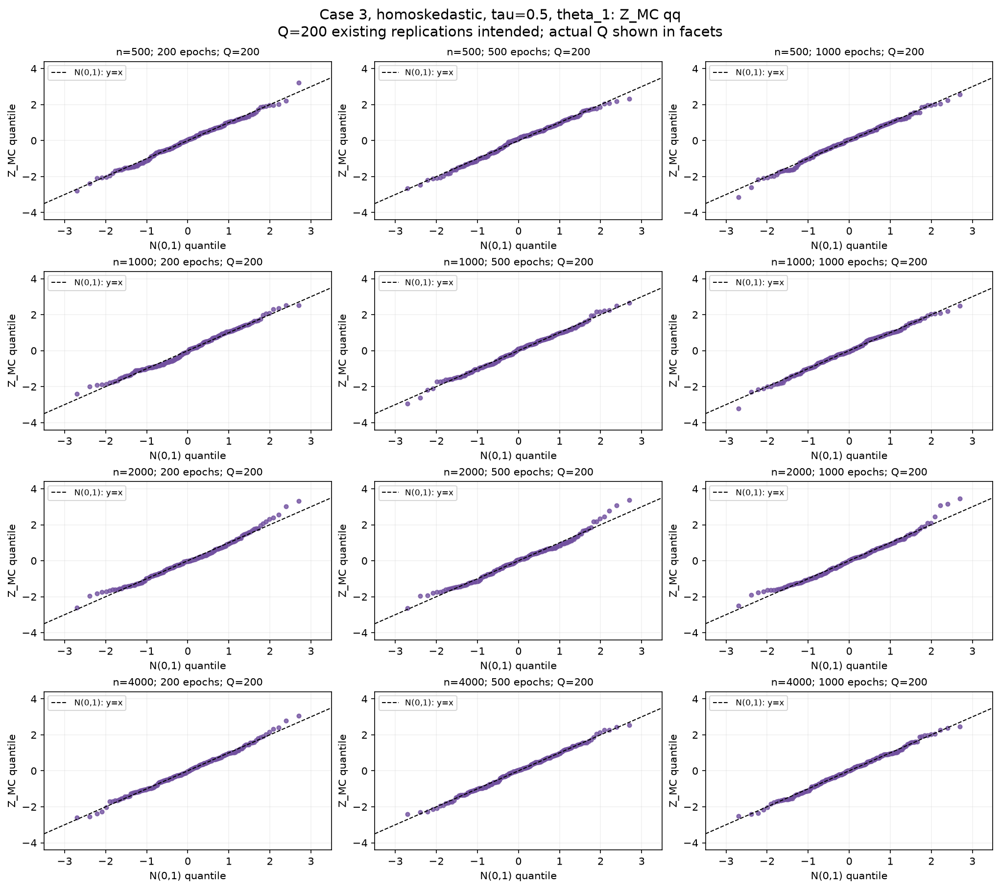

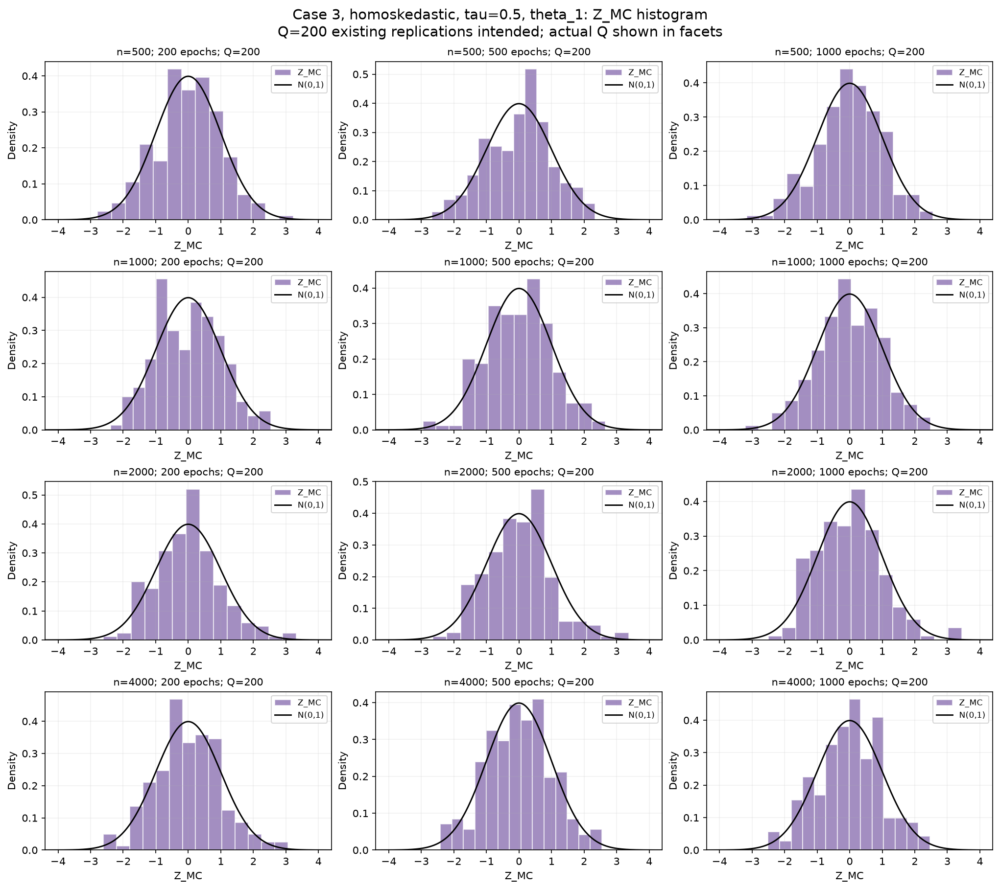

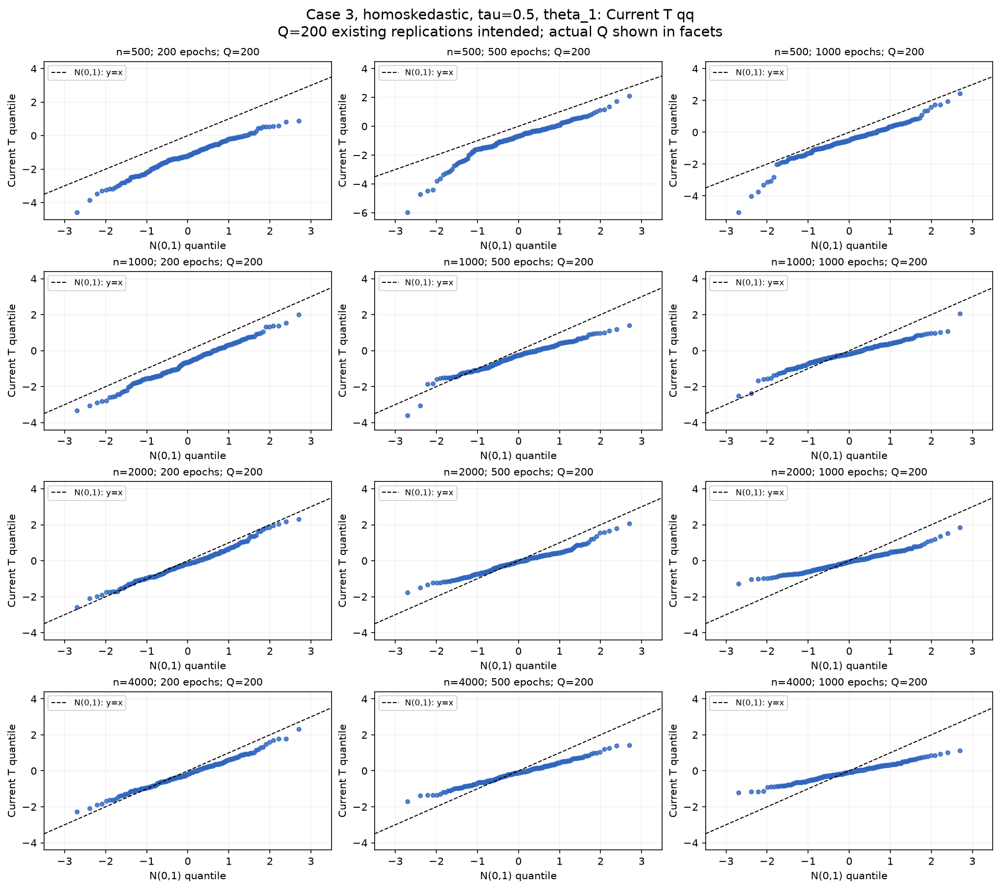

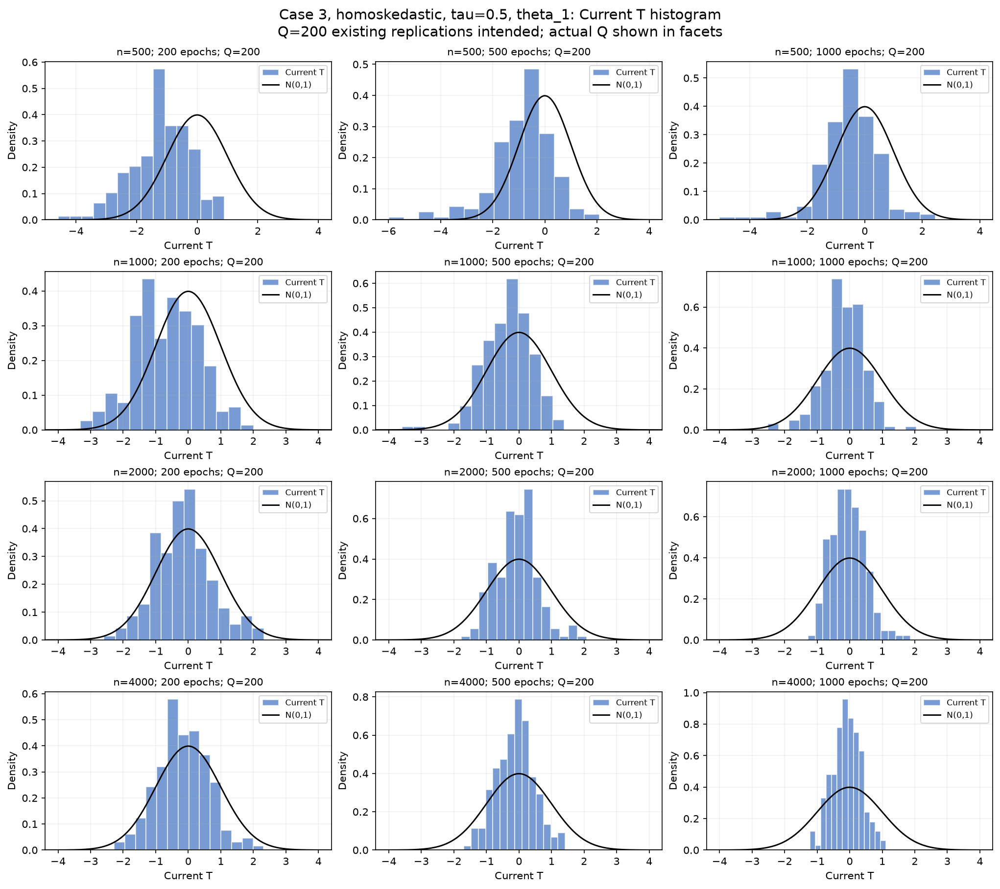

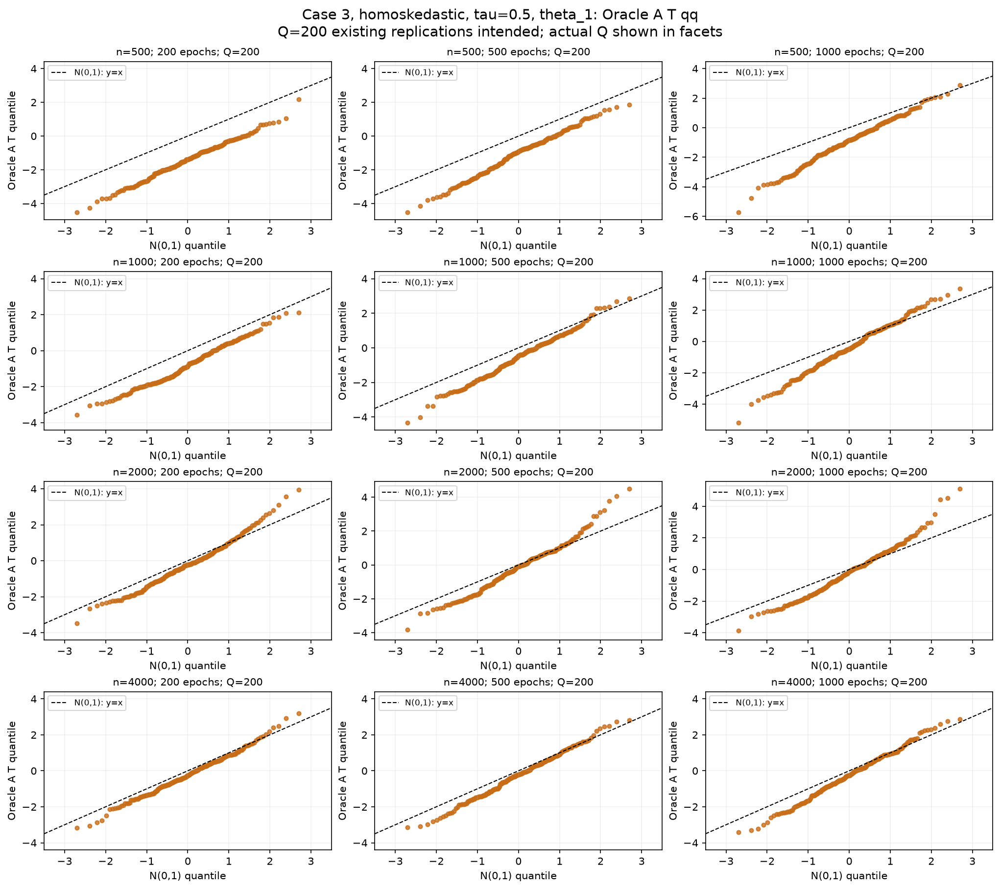

...

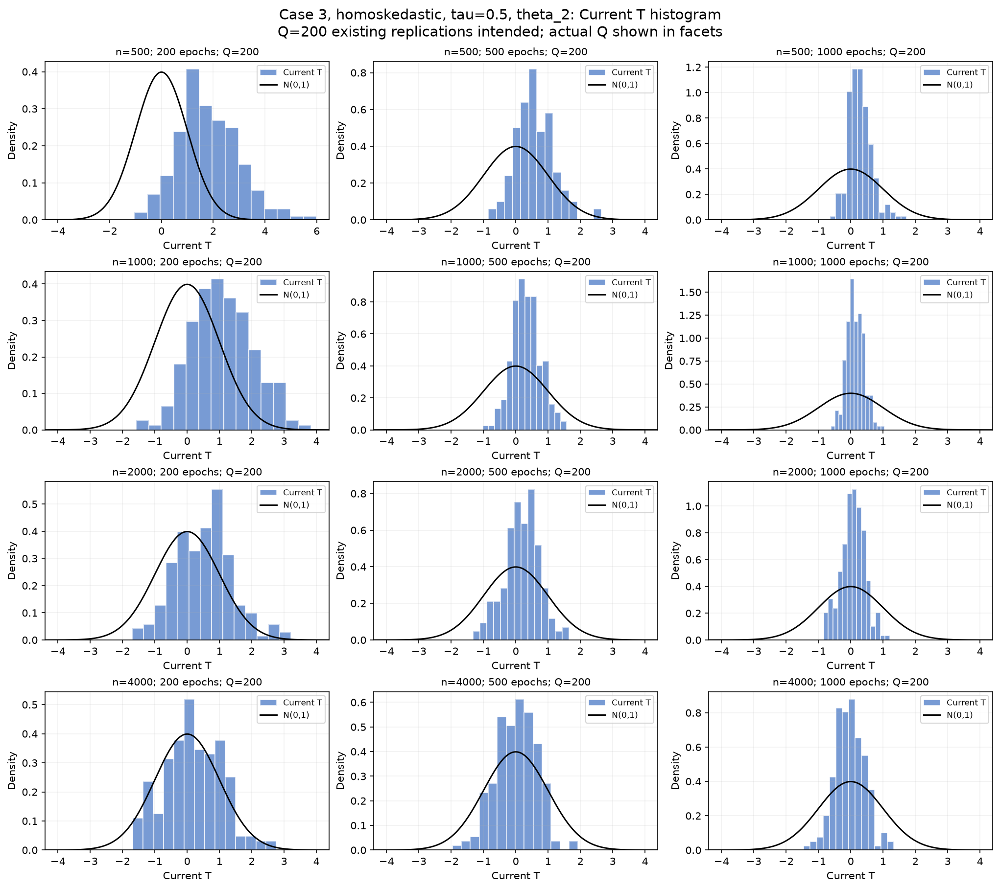

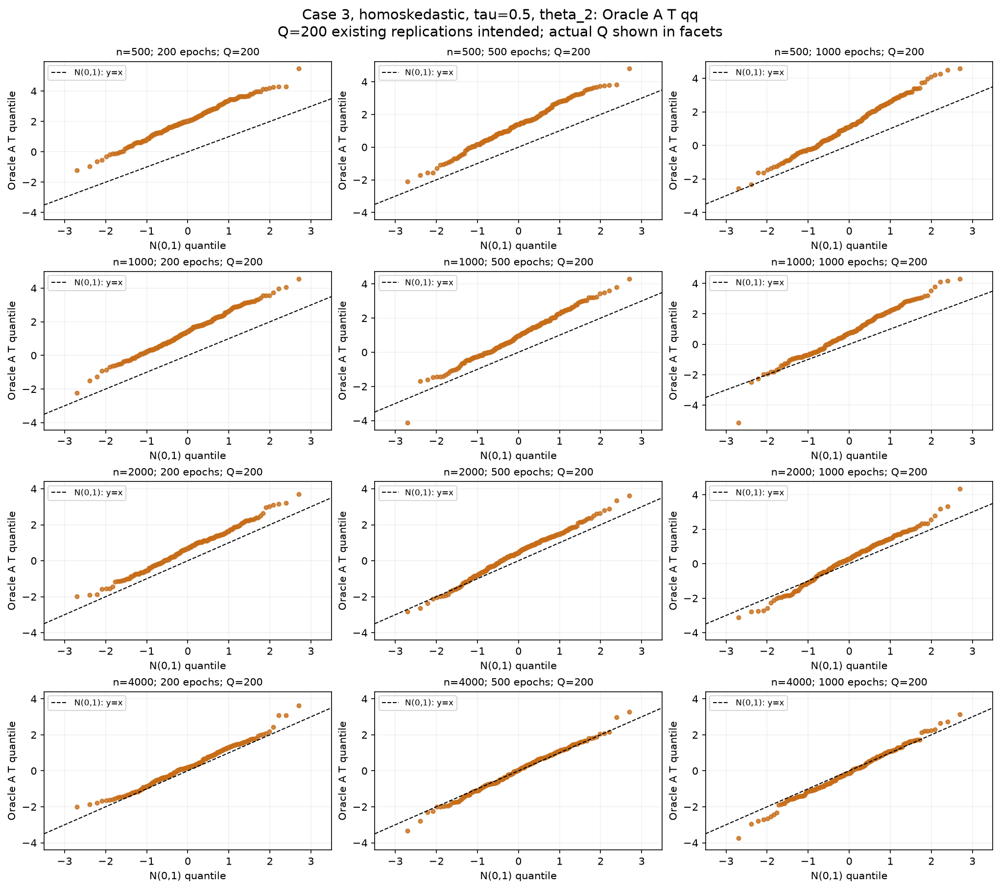

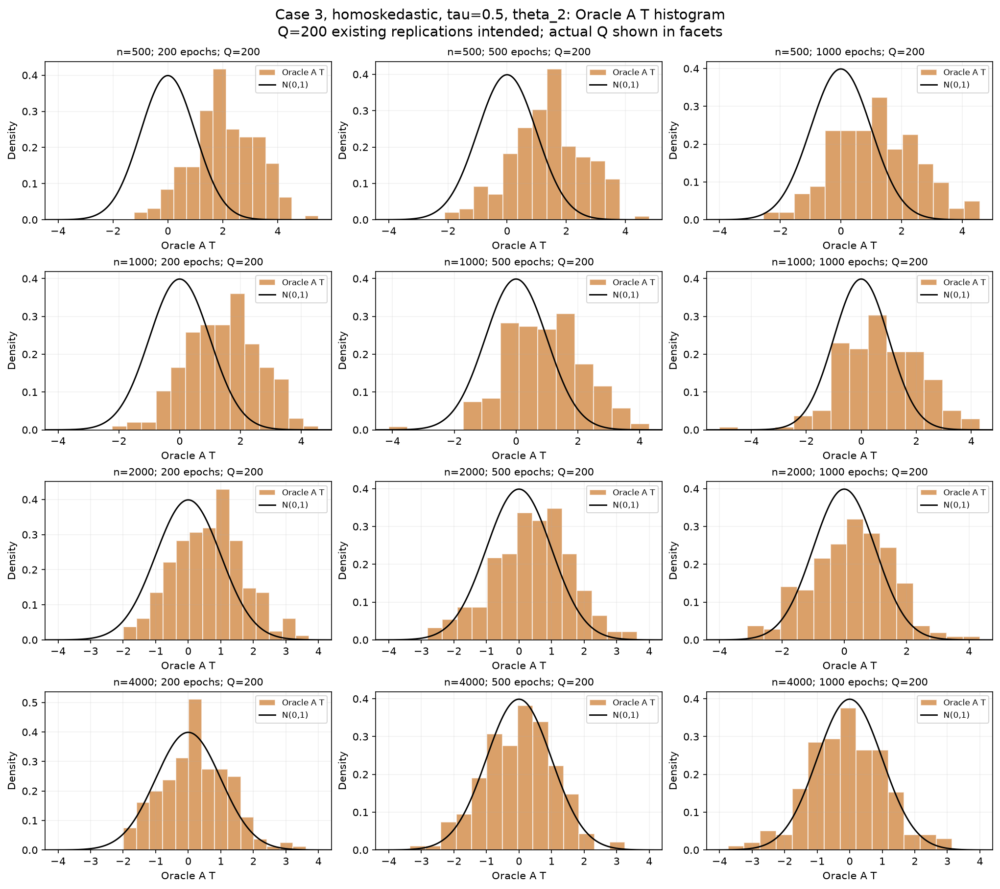

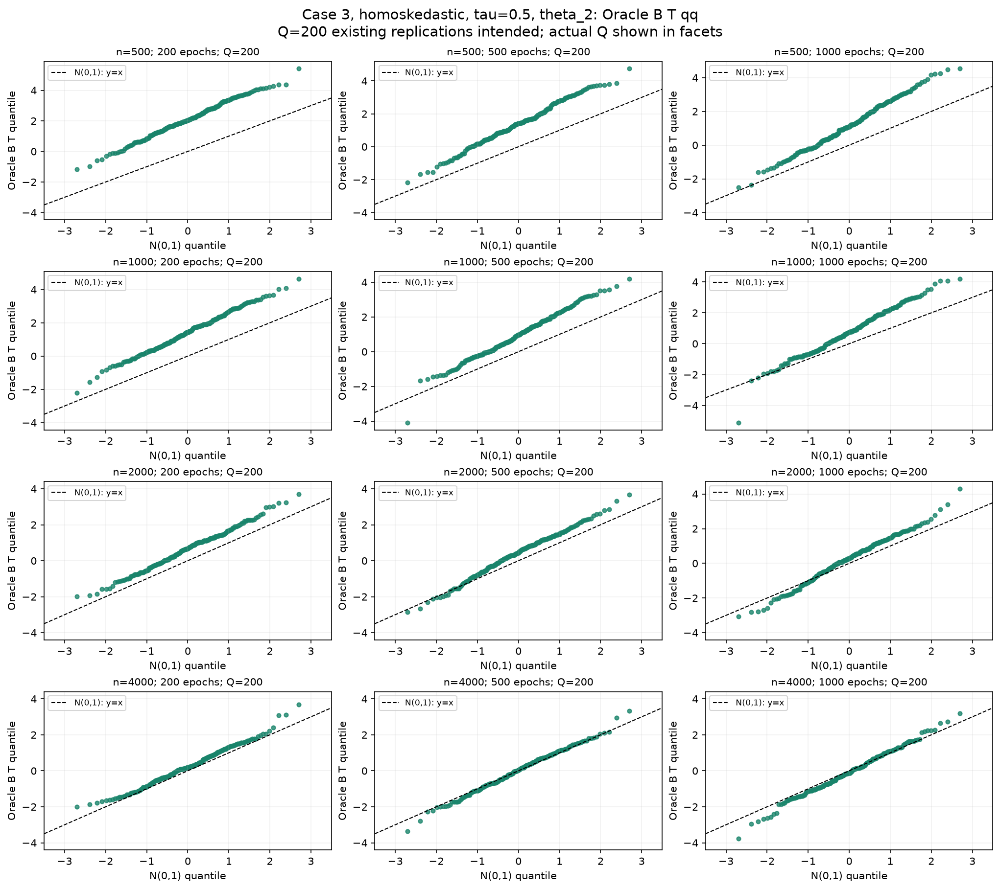

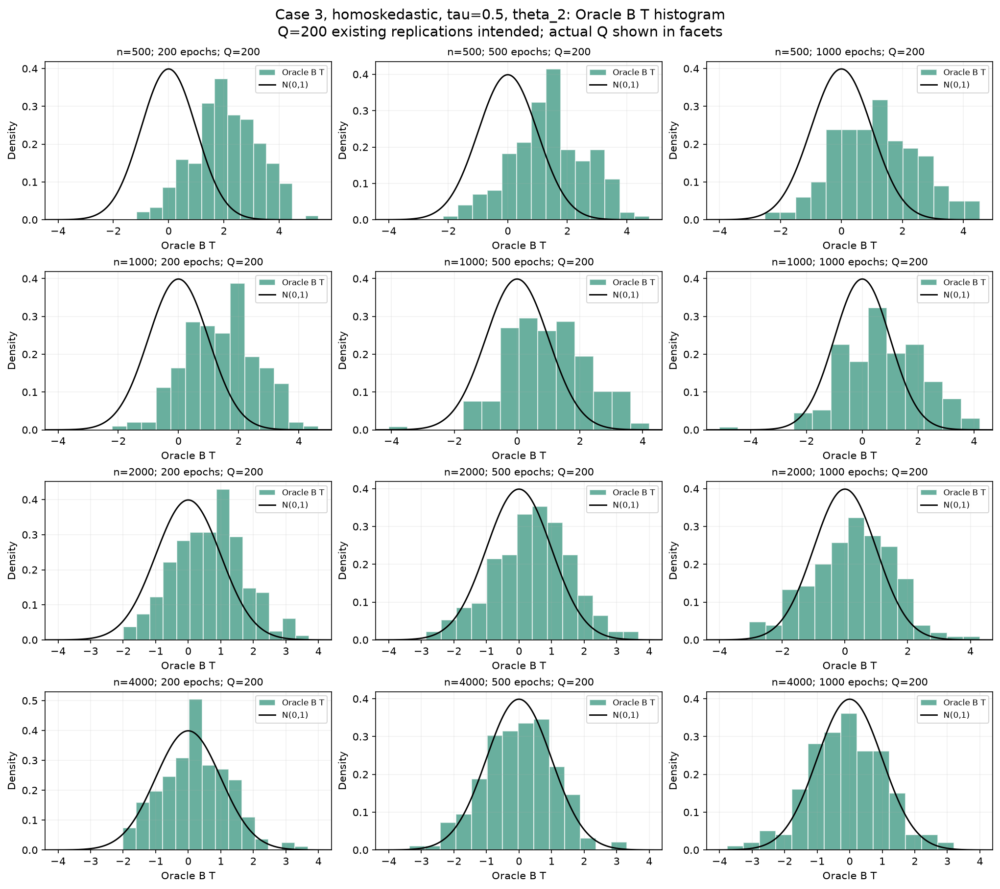

In [7]:
ORACLE_METHODS = [("current", "Current", "#3066BE"), ("oracle_A", "Oracle A", "#C76D18"),
                  ("oracle_B", "Oracle B", "#19846B")]
ORACLE_DISTRIBUTIONS = [("Z_MC", "Z_MC", "#7251A0"), ("T_current", "Current T", "#3066BE"),
                        ("T_oracle_A", "Oracle A T", "#C76D18"), ("T_oracle_B", "Oracle B T", "#19846B")]

def oracle_figure_title(j, subject):
    return (f"Case 3, homoskedastic, tau={ORACLE_TAU:g}, theta_{j}: {subject}\n"
            "Q=200 existing replications intended; actual Q shown in facets")

def oracle_save_figure(fig, name):
    path = ORACLE_FIGURES / name
    with path.open("xb") as stream:
        fig.savefig(stream, format="png", dpi=150, bbox_inches="tight", facecolor="white")
    oracle_created.append(path)
    plt.close(fig)
    display(Image(filename=str(path)))

def oracle_distribution_values(group, statistic, j):
    column = f"T_{j}" if statistic == "T_current" else f"{statistic}_{j}"
    return group[column].dropna().to_numpy(dtype=float)

with plt.rc_context({"font.size": 10, "axes.titlesize": 10, "axes.labelsize": 10}):
    for j in (1, 2):
        for statistic, label, color in ORACLE_DISTRIBUTIONS:
            for kind in ("qq", "histogram"):
                fig, axes = plt.subplots(len(ORACLE_NS), len(ORACLE_EPOCHS),
                    figsize=(13.5, 3.0 * len(ORACLE_NS)), squeeze=False, constrained_layout=True)
                for row, n in enumerate(ORACLE_NS):
                    for col, epochs in enumerate(ORACLE_EPOCHS):
                        ax = axes[row, col]
                        group = oracle_results.loc[(oracle_results.n == n) & (oracle_results.epochs == epochs)]
                        values = oracle_distribution_values(group, statistic, j)
                        ax.set_title(f"n={n}; {epochs} epochs; Q={len(group)}")
                        if len(values) < 2:
                            ax.text(.5, .5, "Insufficient observations", ha="center", transform=ax.transAxes)
                            continue
                        lo, hi = min(-4., float(values.min())), max(4., float(values.max()))
                        padding = .05 * (hi - lo)
                        lo, hi = lo - padding, hi + padding
                        if kind == "qq":
                            theoretical, ordered = probplot(values, dist="norm", fit=False)
                            ax.scatter(theoretical, ordered, s=15, color=color, alpha=.8)
                            ax.plot([-3.5, 3.5], [-3.5, 3.5], "k--", lw=1, label="N(0,1): y=x")
                            ax.set(xlabel="N(0,1) quantile", ylabel=f"{label} quantile", xlim=(-3.5, 3.5), ylim=(lo, hi))
                        else:
                            ax.hist(values, bins=max(8, int(np.sqrt(len(values)))), density=True,
                                    color=color, alpha=.65, edgecolor="white", label=label)
                            grid = np.linspace(lo, hi, 500)
                            ax.plot(grid, norm.pdf(grid), color="black", lw=1.4, label="N(0,1)")
                            ax.set(xlabel=label, ylabel="Density", xlim=(lo, hi))
                        ax.grid(alpha=.18)
                        ax.legend(fontsize=8, loc="best")
                fig.suptitle(oracle_figure_title(j, f"{label} {kind}"), fontsize=14)
                oracle_save_figure(fig, f"theta{j}_{statistic}_{kind}.png")

## 7. Coverage, studentization, SE calibration, and scaled bias versus n

For each component, three epoch facets compare current, Oracle A and Oracle B coverage,
SD(T), mean(T), and reported SE divided by the Monte Carlo SD of the unchanged estimates.
Reference lines are 0.95, 1, 0, and 1 respectively. A separate figure tracks
$\sqrt{n_{train}}$ times the empirical bias for each epoch count. The horizontal axis is total
generated n; variance scaling and the bias multiplier use the verified training sample size.

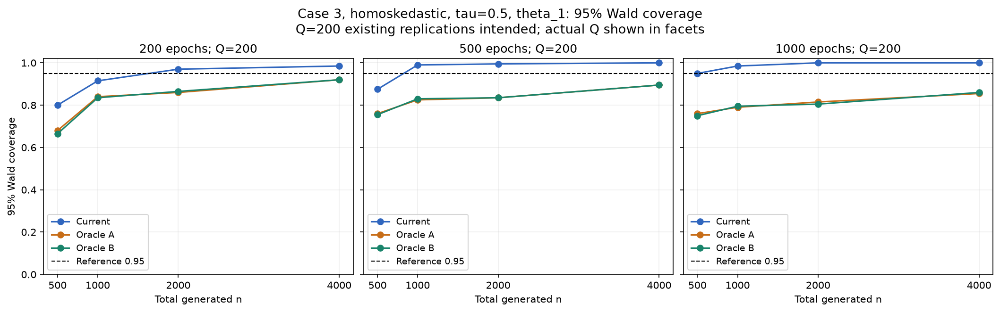

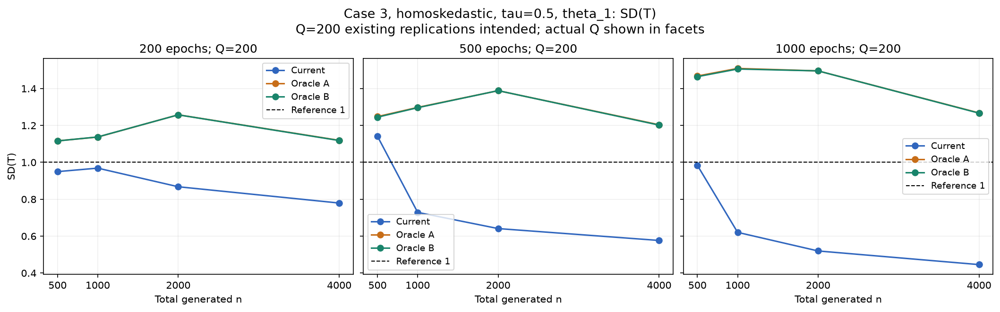

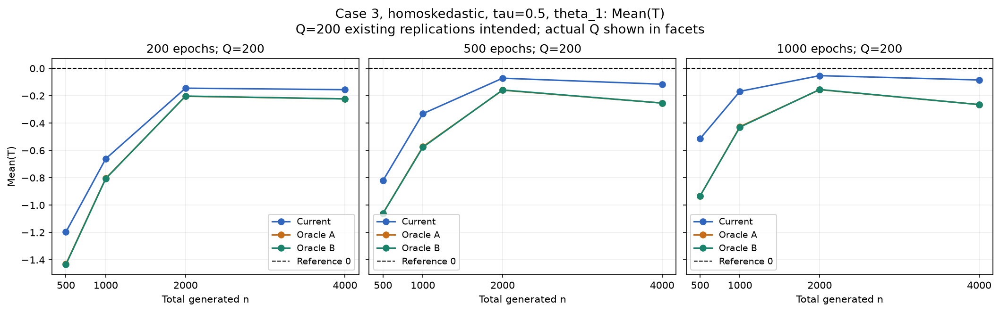

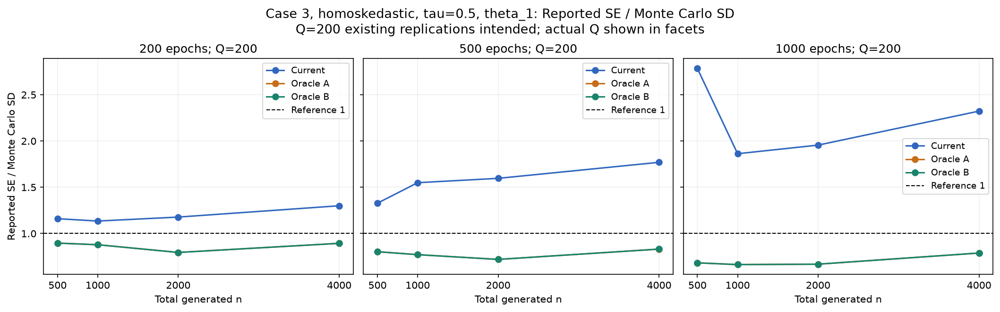

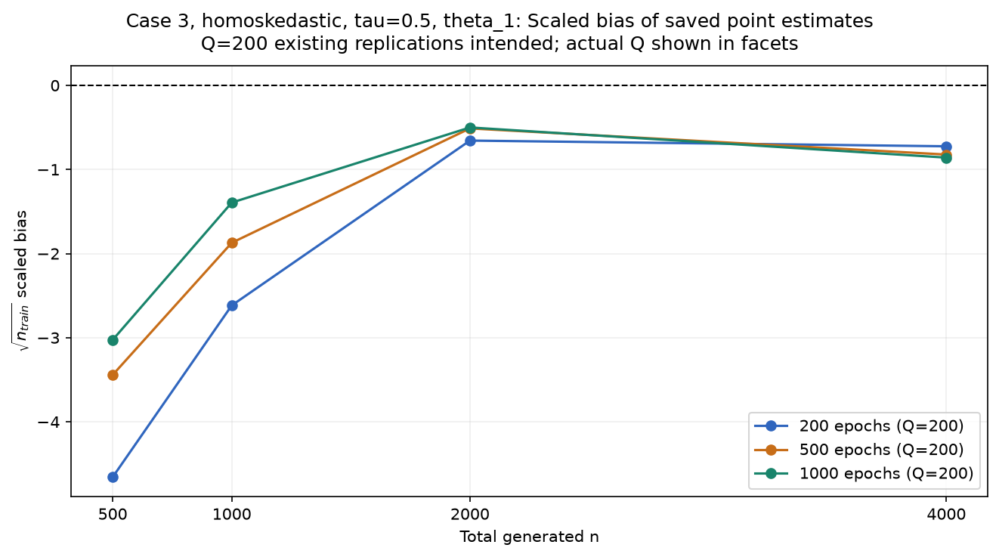

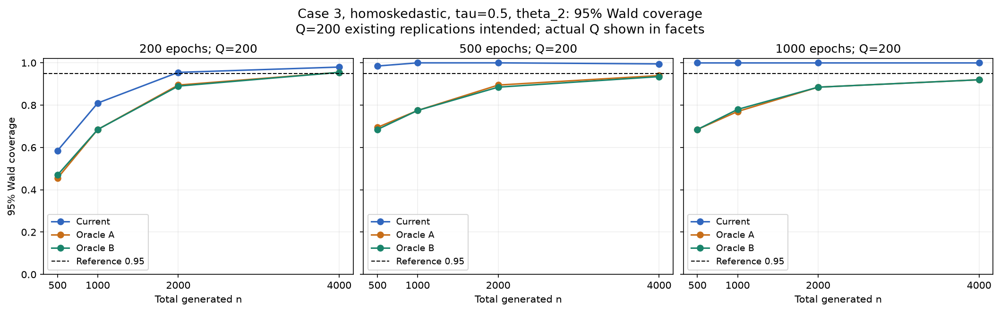

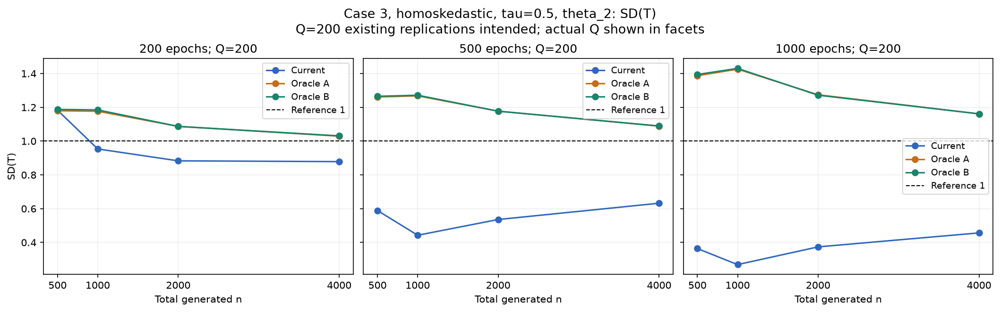

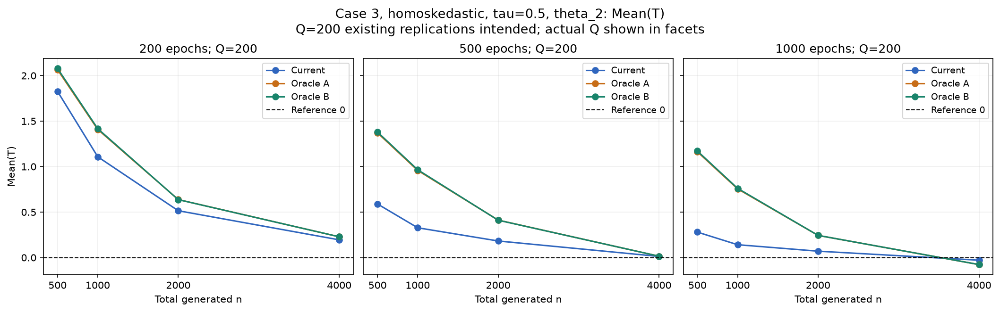

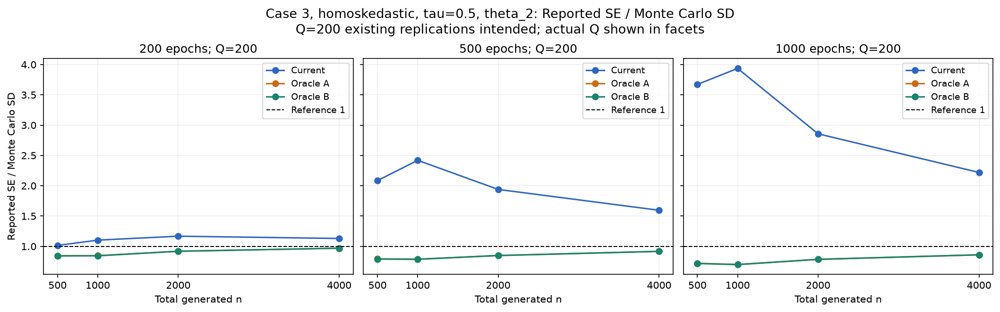

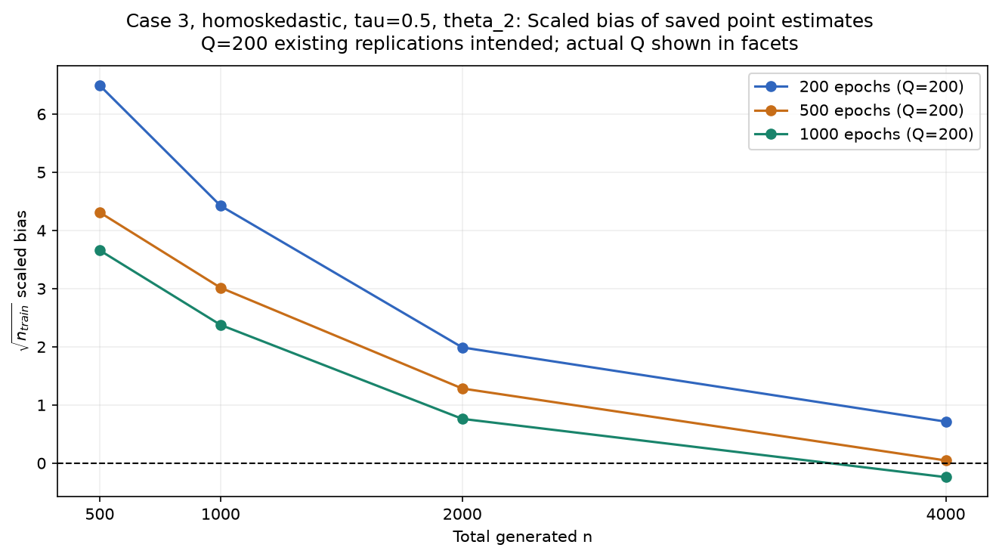

In [8]:
oracle_metric_specs = [
    ("coverage", "95% Wald coverage", .95, "coverage_vs_n.png"),
    ("SD_T", "SD(T)", 1., "sd_T_vs_n.png"),
    ("mean_T", "Mean(T)", 0., "mean_T_vs_n.png"),
    ("SE_over_MC_SD", "Reported SE / Monte Carlo SD", 1., "se_calibration_vs_n.png"),
]
for j in (1, 2):
    component_summary = oracle_summary.loc[oracle_summary.component == f"theta_{j}"]
    for metric, ylabel, reference, filename in oracle_metric_specs:
        fig, axes = plt.subplots(1, len(ORACLE_EPOCHS), figsize=(14, 4.3),
                                 squeeze=False, sharey=True, constrained_layout=True)
        for ax, epochs in zip(axes.flat, ORACLE_EPOCHS):
            group = component_summary.loc[component_summary.epochs == epochs].sort_values("n")
            for method, label, color in ORACLE_METHODS:
                ax.plot(group.n, group[f"{method}_{metric}"], marker="o", color=color, label=label)
            ax.axhline(reference, color="black", ls="--", lw=1, label=f"Reference {reference:g}")
            q_min, q_max = group.Q_available.min(), group.Q_available.max()
            q_text = str(q_min) if q_min == q_max else f"{q_min}-{q_max}"
            ax.set(title=f"{epochs} epochs; Q={q_text}", xlabel="Total generated n", xticks=ORACLE_NS)
            if metric == "coverage":
                ax.set_ylim(0, 1.02)
            ax.grid(alpha=.2)
            ax.legend(fontsize=9)
        axes[0, 0].set_ylabel(ylabel)
        fig.suptitle(oracle_figure_title(j, ylabel), fontsize=13)
        oracle_save_figure(fig, f"theta{j}_{filename}")
    fig, ax = plt.subplots(figsize=(8.7, 4.8), constrained_layout=True)
    for epochs, color in zip(ORACLE_EPOCHS, ["#3066BE", "#C76D18", "#19846B"]):
        group = component_summary.loc[component_summary.epochs == epochs].sort_values("n")
        q_text = str(group.Q_available.min()) if group.Q_available.nunique() == 1 else f"{group.Q_available.min()}-{group.Q_available.max()}"
        ax.plot(group.n, group.sqrt_n_train_scaled_bias, marker="o", color=color,
                label=f"{epochs} epochs (Q={q_text})")
    ax.axhline(0, color="black", ls="--", lw=1)
    ax.set(xlabel="Total generated n", ylabel=r"$\sqrt{n_{train}}$ scaled bias", xticks=ORACLE_NS)
    ax.grid(alpha=.2)
    ax.legend()
    fig.suptitle(oracle_figure_title(j, "Scaled bias of saved point estimates"), fontsize=12)
    oracle_save_figure(fig, f"theta{j}_scaled_bias_vs_n.png")

## Oracle nuisance diagnostic: interpretation

- **Shape:** a nearly linear identity QQ plot for $Z_{MC}$ suggests approximately Gaussian shape
  after empirical recentering and rescaling. Its mean and SD are fixed by construction, so these
  two numbers provide no evidence of correct inferential centering or scale.
- **Population scale and centering:** $T_{oracle\ B}$ tests whether the saved estimates are centered
  at the true coefficient and scaled by the theoretical population asymptotic variance. A nonzero
  mean indicates bias relative to that SE; an SD far from 1 indicates a variance-scale discrepancy.
- **Nuisance substitution:** if Oracle B is close to $N(0,1)$ while current T is not, nuisance or
  variance estimation is a likely contributor. If Oracle A also behaves well while current T does
  not, estimating $\phi^*$ and/or $f(0)$ is particularly suspect. This joint substitution cannot
  attribute the effect to one nuisance alone.
- **Finite-sample Omega:** differences between Oracle A and B measure the impact of using the
  regenerated sample covariance in the denominator. The separate moment-normalization results
  quantify the small change from centered $1/(n_{train}-1)$ to uncentered $1/n_{train}$.
- **Remaining discrepancy:** if Oracle B is still badly centered or its SD is far from 1,
  estimating $\phi^*$ and $f(0)$ cannot explain the full discrepancy. Bias, the point-estimation
  algorithm, approximation error, optimization, or the finite-sample accuracy of the asymptotic
  expansion require further investigation. Nonnormal shape, finite-sample bias, wrong variance
  scale, and nuisance-estimation error are separate issues.

These are finite-sample diagnostics of this fixed architecture and training procedure, using paired
epoch fits. They neither establish nor refute the theorem's asymptotic claims. Q=200 leaves meaningful
Monte Carlo uncertainty in coverage and tail summaries. Read QQ/histogram panels together with
scaled bias, calibration ratios and the numerical summaries, without treating any one statistic as a verdict.

### Observed results from these Q=200 fits

- Across all 24 component/settings, $Z_{MC}$ skewness ranges from -0.224 to 0.467 and
  excess kurtosis from -0.487 to 0.623. The bulk QQ shapes are broadly compatible with
  approximate Gaussian shape after empirical recentering/rescaling; finite-Q tail differences remain.
- At n=4000, Oracle B coverage for $\theta_1$ is **0.920, 0.895, 0.860** at 200, 500, 1000 epochs;
  its SD(T) is **1.118, 1.202, 1.267** and mean(T) is **-0.223, -0.254, -0.265**.
  For $\theta_2$, the corresponding coverage is **0.955, 0.935, 0.920**, SD(T) is
  **1.031, 1.090, 1.161**, and mean(T) is **0.228, 0.015, -0.077**.
- At the same n, current coverage is **0.985, 1.000, 1.000** for $\theta_1$ and
  **0.980, 0.995, 1.000** for $\theta_2$. Its SD(T) drops to about **0.446** and **0.457**
  at 1000 epochs. Current denominators can therefore be too large relative to the actual
  Monte Carlo spread, while population-oracle denominators can still be too small.
- Oracle A and B coverage differ by at most **0.015** across the full grid. The alternative
  uncentered moment normalization changes individual Oracle A SEs by at most **1.13%**.
  Sample Omega variability and normalization are not large enough here to explain the full discrepancy.
- The true density is **0.3675525969**; the overall mean saved density estimate is **0.5692802254**.
  Groupwise mean estimated/true density ratios range from **0.768 to 2.636**, changing with n and epochs.
  This confirms density estimation differences, but their separate effect cannot be inferred from
  these ratios because estimated projection residual covariance also enters the current SE.

In this run, roughly Gaussian empirical shape coexists with bias and variance-scale errors.
Oracle substitution does **not** universally restore nominal inference, especially for $\theta_1$
and smaller n. Nuisance estimation contributes to the contrast with current inference, but cannot
explain the whole discrepancy. This conclusion concerns the saved finite-sample fits, not the validity
of the theorem under its assumptions.


In [9]:
print("Largest sample size: empirical shape, inferential centering and scale")
display(oracle_summary.loc[oracle_summary.n == max(ORACLE_NS), [
    "epochs", "component", "Q_available", "sqrt_n_train_scaled_bias",
    "current_mean_T", "oracle_A_mean_T", "oracle_B_mean_T",
    "current_SD_T", "oracle_A_SD_T", "oracle_B_SD_T",
    "current_coverage", "oracle_A_coverage", "oracle_B_coverage",
    "Z_MC_skewness", "Z_MC_excess_kurtosis",
]].round(4))
print("Oracle B coverage range:", oracle_summary.oracle_B_coverage.min(), oracle_summary.oracle_B_coverage.max())
print("Largest absolute change in Oracle A SE from moment normalization:",
      oracle_summary.oracle_A_moment_max_abs_relative_SE_change.max())

Largest sample size: empirical shape, inferential centering and scale


,epochs,component,Q_available,sqrt_n_train_scaled_bias,current_mean_T,oracle_A_mean_T,oracle_B_mean_T,current_SD_T,oracle_A_SD_T,oracle_B_SD_T,current_coverage,oracle_A_coverage,oracle_B_coverage,Z_MC_skewness,Z_MC_excess_kurtosis
18,200,theta_1,200,-0.7243,-0.1555,-0.2229,-0.2232,0.7794,1.1193,1.1182,0.985,0.920,0.920,0.1407,0.2232
19,200,theta_2,200,0.7134,0.1948,0.2284,0.2284,0.8785,1.0291,1.0309,0.980,0.955,0.955,0.2427,0.0699
20,500,theta_1,200,-0.8227,-0.1154,-0.2532,-0.2535,0.5766,1.2037,1.2019,1.000,0.895,0.895,0.0053,-0.2297
21,500,theta_2,200,0.0460,0.0124,0.0145,0.0147,0.6323,1.0885,1.0896,0.995,0.940,0.935,-0.0888,0.0913
22,1000,theta_1,200,-0.8590,-0.0845,-0.2646,-0.2647,0.4457,1.2677,1.2666,1.000,0.855,0.860,-0.0395,-0.2126
23,1000,theta_2,200,-0.2406,-0.0290,-0.0773,-0.0770,0.4566,1.1611,1.1614,1.000,0.920,0.920,-0.0617,0.2044


Oracle B coverage range: 0.47 0.955
Largest absolute change in Oracle A SE from moment normalization: 0.011279131192776126


## Preservation audit and new files

The following checks verify every file that existed when this section started, including the original
CSV/configuration/checkpoints/figures. They also verify the original cells against the pre-edit backup.
The saved manifest documents scientific settings, source hashes, population numerical accuracy,
and completed checks. All writes above use exclusive creation; a later run receives a fresh directory.
The final output lists every new analysis file plus the notebook backup. The existing notebook itself
is extended, so it is not a new file.

In [10]:
assert oracle_sha256(ORACLE_RUN / "raw_replications.csv") == oracle_raw_hash
oracle_original_from_backup = json.loads((ORACLE_EXPERIMENT / "asymptotic_normality_case3_before_oracle.ipynb").read_text(encoding="utf-8"))
oracle_live_notebook = json.loads(ORACLE_NOTEBOOK.read_text(encoding="utf-8"))
assert oracle_live_notebook["cells"][:len(oracle_original_from_backup["cells"])] == oracle_original_from_backup["cells"]
for relative, digest in oracle_existing_hashes.items():
    assert oracle_sha256(ORACLE_EXPERIMENT / relative) == digest, f"Existing file changed during oracle execution: {relative}"
oracle_save_json(dict(
    created_utc=datetime.now(timezone.utc).isoformat(), case=3, tau=ORACLE_TAU,
    theta=ORACLE_THETA.tolist(), true_f0=ORACLE_F0, input_raw_sha256=oracle_raw_hash,
    source_sha256=oracle_source_hashes, original_experiment_code_sha256=oracle_identity["implementation_sha256"],
    versions={name: importlib.metadata.version(name) for name in ["numpy", "pandas", "scipy", "scikit-learn", "matplotlib"]},
    sample_sizes=list(ORACLE_NS), epochs=list(ORACLE_EPOCHS), Q_requested=ORACLE_EXPECTED_Q,
    all_cells_have_Q200=bool(oracle_counts.complete_Q200.all()), saved_fit_rows=len(oracle_raw),
    distinct_datasets=len(oracle_samples), all_seed_and_dataset_hash_checks_passed=True,
    oracle_A_normalization="centered residual covariance / (n_train - 1), matching paper eq.14 and current code",
    sensitivity_normalization="uncentered v.T @ v / n_train",
    oracle_B_normalization="uncentered population second moment / M",
    oracle_interval_critical_value=ORACLE_CRITICAL, current_interval_critical_value=float(norm.ppf(.975)),
    all_oracle_A_SEs_identical_across_epochs=True, finite_inferential_statistics=True,
    Z_MC_available_rows={str(j): int(oracle_results[f"Z_MC_{j}"].notna().sum()) for j in (1, 2)},
    point_estimates_unchanged=True, original_notebook_cells_preserved=True,
    existing_files_checked=len(oracle_existing_hashes), all_existing_files_unchanged_during_execution=True,
    population_size=ORACLE_POPULATION_SIZE, population_seed=ORACLE_POPULATION_SEED,
    population_relative_SE_MCSE=oracle_factor_relative_mcse,
    projection_diagnostics_in_original_raw=oracle_phi_columns,
    neural_network_fits_launched=0, R_invocations=0,
), "oracle_analysis_manifest.json")
print(f"Preservation checks passed for {len(oracle_existing_hashes):,} existing files and all original cells.")
oracle_file_list = ORACLE_OUTPUT / "new_files_created.txt"
oracle_listing = [ORACLE_EXPERIMENT / "asymptotic_normality_case3_before_oracle.ipynb"]
oracle_listing += sorted(p for p in ORACLE_OUTPUT.rglob("*") if p.is_file())
oracle_listing.append(oracle_file_list)
with oracle_file_list.open("x", encoding="utf-8") as stream:
    stream.write("New files from the oracle extension (existing notebook appended separately):\n")
    stream.write("\n".join(p.relative_to(ORACLE_EXPERIMENT).as_posix() for p in oracle_listing) + "\n")
print("NEW FILES (relative to the Case 3 experiment directory):")
print(oracle_file_list.read_text(encoding="utf-8"))

Preservation checks passed for 4,810 existing files and all original cells.
NEW FILES (relative to the Case 3 experiment directory):
New files from the oracle extension (existing notebook appended separately):
asymptotic_normality_case3_before_oracle.ipynb
run/oracle_diagnostics/density_comparison.csv
run/oracle_diagnostics/figures/theta1_coverage_vs_n.png
run/oracle_diagnostics/figures/theta1_mean_T_vs_n.png
run/oracle_diagnostics/figures/theta1_scaled_bias_vs_n.png
run/oracle_diagnostics/figures/theta1_sd_T_vs_n.png
run/oracle_diagnostics/figures/theta1_se_calibration_vs_n.png
run/oracle_diagnostics/figures/theta1_T_current_histogram.png
run/oracle_diagnostics/figures/theta1_T_current_qq.png
run/oracle_diagnostics/figures/theta1_T_oracle_A_histogram.png
run/oracle_diagnostics/figures/theta1_T_oracle_A_qq.png
run/oracle_diagnostics/figures/theta1_T_oracle_B_histogram.png
run/oracle_diagnostics/figures/theta1_T_oracle_B_qq.png
run/oracle_diagnostics/figures/theta1_Z_MC_histogram.png
ru